In [1]:
import numpy as np
import healpy as hp

import matplotlib
from matplotlib import pyplot as plt

from scipy import stats
import matplotlib.gridspec as gridspec
import astropy.cosmology.units as cu
import astropy.units as u
import site
site.addsitedir('/oak/stanford/orgs/kipac/users/mahlet/quaia_bias/scripts') 
import quaia
import seaborn as sns
from matplotlib.colors import LogNorm
import matplotlib.patches as mpatches
import pyccl as ccl
from matplotlib.lines import Line2D
from matplotlib import cm
from scipy.optimize import minimize
from astropy.cosmology import Planck18
from dynesty import NestedSampler
from dynesty import plotting as dyplot
from dynesty import utils as dyfunc
from astropy.coordinates import SkyCoord
from healpy.newvisufunc import projview
from scipy import special

In [2]:
matplotlib.rcParams['ytick.labelsize'] = 18
matplotlib.rcParams['xtick.labelsize'] = 18
matplotlib.rcParams['axes.labelsize'] = 22
matplotlib.rcParams['legend.fontsize'] = 18
matplotlib.rcParams['axes.titlesize'] = 20

# Model using step-function HOD
## Define parameters

In [3]:
G_hi = 20.5

In [4]:
nthreads = 18

In [5]:
z_bins = np.array([0.0, 1.0, 2.0, 3.0, 4.6])
z_array = range(len(z_bins)-1)
mask = 0.5

In [6]:
cosmo_planck18 = ccl.Cosmology(Omega_c=0.265, Omega_b=Planck18.Ob0, h=Planck18.h, Neff = Planck18.Neff, T_CMB = Planck18.Tcmb0.value, m_nu = Planck18.m_nu, sigma8=0.8, n_s=0.95)

In [7]:
Delta = 200
delta_c = 1.686

In [8]:
hmf = ccl.halos.MassFuncTinker10()

In [9]:
NSIDE = 64

In [10]:
M_max = 15

## Define functions

In [11]:
def a_median(tab_datahi_mask_zbin0, key_zbin0 = ''):
    return 1/(1+np.median(tab_datahi_mask_zbin0['redshift_quaia'+key_zbin0]))

In [12]:
def b_qso(xi_qq, xi_mm, f):
    
    return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3

In [13]:
def nu(M, delta_c = delta_c, a = 1, cosmo = cosmo_planck18):
    
    sigma = cosmo.sigmaM(M, a = a)
   
    return delta_c/sigma

In [14]:
def n_g_theory(bins, n_total, a = 1, cosmo = cosmo_planck18, hmf = hmf, recenter = True):

    if recenter == True:
        bins = quaia.recenter(bins)
    nm = hmf(cosmo, bins, a)/cosmo['h']**3
    n_g = nm/(bins*np.log(10))*n_total
    n_g[np.isnan(n_g)]=0
    
    return n_g, nm

def bias(bins, n_m, a = 1, cosmo = cosmo_planck18, mod = False, recenter = True):

    n_g, nm = n_g_theory(bins, n_m, a = a, cosmo = cosmo, recenter = recenter)
    if recenter == True:
        print('recentering')
        bins = quaia.recenter(bins)
    n_g = np.trapz(n_g, bins)
    dn_dm = nm/(bins*np.log(10))

    b1_E_tinker = b1_E_func(nu(bins, a = a, cosmo = cosmo), mod = mod)

    n_m[~np.isfinite(n_m)]=0 
    integrand = dn_dm*n_m
    integrand[np.isnan(integrand)]=0
    
    return bias_function(n_g, integrand, b1_E_tinker, bins, recenter = recenter), n_g

In [15]:
def b1_E_func(nu, Delta = Delta, delta_c = delta_c, mod = False):

    delta_c = 1.686
    
    if mod == False:
        y = np.log10(Delta)
        A =  1.0+0.24*y*np.exp(-(4/y)**4)
        a = 0.44*y-0.88
        B = 0.183
        b =  1.5
        C = 0.019+0.107*y+0.19*np.exp(-(4/y)**4)
        c = 2.4
        
    else:
        A =  1.0
        a = 0.0906
        B = -4.5002
        b =  2.1419
        C = 4.9148
        c = 2.1419
        
    return 1-A*nu**a/(nu**a+delta_c**a)+B*nu**b+C*nu**c # Jose et al
    
def bias_function(n_g, integrand, b, bins, recenter = True):
    
    if recenter == True:
        print('recentering')
        bins = quaia.recenter(bins)
        
    return 1/n_g*np.trapz(integrand*b, bins)

In [16]:
def cf_2h(bins, n_m, a, cosmo, cf_matter, recenter = True):
    
    b_q, n_g = bias(bins, n_m, a, cosmo, recenter = recenter)
    return b_q**2*cf_matter, b_q

In [17]:
def M(bins, n_m, a = 1, cosmo = cosmo_planck18, mod = False, recenter = True, hmf = hmf):

    n_g, nm = n_g_theory(bins, n_m, a = a, cosmo = cosmo, recenter = recenter, hmf = hmf)
    if recenter == True:
        n_g = np.trapz(n_g, quaia.recenter(bins))
        dm = np.diff(bins) 
        dn_dm = nm/(quaia.recenter(bins)*np.log(10))
    else:
        n_g = np.trapz(n_g, bins)
        dn_dm = nm/(bins*np.log(10))

    n_m[~np.isfinite(n_m)]=0 
    integrand = dn_dm*n_m
    integrand[np.isnan(integrand)]=0
    
    if recenter == True:
        return bias_function(n_g, integrand, quaia.recenter(bins), bins, recenter = recenter), n_g
    else:
        return bias_function(n_g, integrand, bins, bins, recenter = recenter), n_g

In [18]:
def HOD(bins, M_min, fduty):

    n_m=np.zeros(np.shape(quaia.recenter(bins)))
    n_m[quaia.recenter(bins)>=M_min]=fduty

    return n_m

In [19]:
def n_DM(cosmo, a, M_min, hmf = hmf, M_max = M_max, N = 79): #16.8
    
    bins = np.logspace(M_min, M_max, N)
    nm = hmf(cosmo, bins, a)/cosmo['h']**3 #/u.Mpc**3 # convert to h/Mpc**3
    dn_dm = nm/(bins*np.log(10))
    
    return np.trapz(dn_dm, bins)

# Implement halo model
## Plot HOD: $\langle N\left(M\right)\rangle=\frac{f_{\text {duty }}}{2} \operatorname{erfc}\left[\frac{\ln (M_\mathrm{min} / M)}{\sqrt{2} \log{10} \Sigma}\right]$
### At fixed $f_{duty}$ and $M_{min}$

In [20]:
n_bins = 79 #159

In [21]:
bins = np.logspace(9, M_max, n_bins)

In [22]:
M_min_array = [11.94, 11.98, 11.97, 12.07]

In [23]:
fduty = [0.002, 0.002, 0.003, 0.002]
    
# def HOD_scatter(i, M, sigma, fduty = fduty, M_min_array = M_min_array):
    
#     return fduty[i]/2*special.erfc(np.log(10**M_min_array[i]/M)/(np.sqrt(2)*sigma))

def HOD_scatter(fduty, M_min, M, sigma):
    
    return fduty/2*special.erfc(np.log(10**M_min/M)/(np.sqrt(2)*np.log(10)*sigma))

In [24]:
cmap_blue = plt.get_cmap('Blues')(np.linspace(0.333, 0.999, len(z_array)))

<>:19: SyntaxWarning: invalid escape sequence '\l'
<>:33: SyntaxWarning: invalid escape sequence '\o'
<>:40: SyntaxWarning: invalid escape sequence '\S'
<>:19: SyntaxWarning: invalid escape sequence '\l'
<>:33: SyntaxWarning: invalid escape sequence '\o'
<>:40: SyntaxWarning: invalid escape sequence '\S'
/tmp/ipykernel_119335/2024153798.py:19: SyntaxWarning: invalid escape sequence '\l'
  ax1.plot(bins_i, n_m, linewidth = 2.5, label = '${:.0f}<z \leq{:.0f}$'.format(i, i+1), color = cmap_blue[i])
/tmp/ipykernel_119335/2024153798.py:33: SyntaxWarning: invalid escape sequence '\o'
  ax1.set_xlabel('$M (M_\odot)$')
/tmp/ipykernel_119335/2024153798.py:40: SyntaxWarning: invalid escape sequence '\S'
  ax1.set_title('$\Sigma={}$ dex'.format(sigma_array[j]))
/tmp/ipykernel_119335/984112801.py:9: RuntimeWarning: divide by zero encountered in divide
  return fduty/2*special.erfc(np.log(10**M_min/M)/(np.sqrt(2)*np.log(10)*sigma))
/tmp/ipykernel_119335/984112801.py:9: RuntimeWarning: invalid value

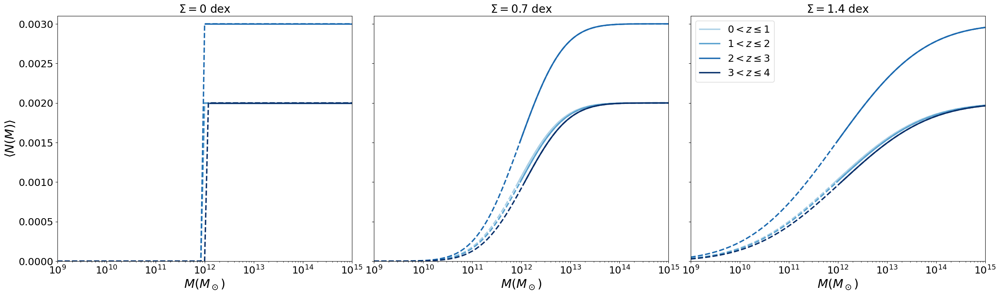

In [25]:
fig = plt.figure(figsize = (30, 8))
gs = gridspec.GridSpec(1, 3, wspace = 0.075)
sigma_array = [0, 0.7, 1.4]
n_m_array, bins_M_min = [], []

for j in range(len(sigma_array)):
    
    ax1 = fig.add_subplot(gs[j])
        
    # print('sigma:',sigma_array[j])
    for i in z_array:
        
        bins_i = np.logspace(M_min_array[i], M_max, n_bins)

        # ax1.plot(bins_i, HOD_scatter(i, bins_i, sigma=sigma[j]), linewidth = 2.5, label = '${:.0f}<z \leq{:.0f}$'.format(i, i+1), color = cmap_blue[i])
        # ax1.plot(bins, HOD_scatter(i, bins, sigma=sigma[j]), linewidth = 2.5, linestyle ='--', color = cmap_blue[i])

        n_m = HOD_scatter(fduty[i], M_min_array[i], bins_i, sigma_array[j])
        ax1.plot(bins_i, n_m, linewidth = 2.5, label = '${:.0f}<z \leq{:.0f}$'.format(i, i+1), color = cmap_blue[i])
        ax1.plot(bins, HOD_scatter(fduty[i], M_min_array[i], bins, sigma_array[j]), linewidth = 2.5, linestyle ='--', color = cmap_blue[i])
        
        # bins_i = np.logspace(M_min_array[i]-3*sigma_array[j]/np.log(10), M_max, 79)
        # ax1.plot(bins_i, HOD_scatter(fduty[i], M_min_array[i], bins_i, sigma_array[j]), linewidth = 2.5, linestyle ='--', color = cmap_blue[i])
        
        # print('z:',zbin[i], 'b_q:',cf_2h(bins_i, n_m, a_zbin[i], cosmo_planck18, cf_matter_chi2[i], 
        #                     recenter = False)[1])
        if j == 0:
            
            n_m_array.append(n_m)
            bins_M_min.append(bins_i)
    
    ax1.set_xscale('log')
    ax1.set_xlabel('$M (M_\odot)$')
    
    if j== 0:
        ax1.set_ylabel(r'$\langle N(M) \rangle$')
    else:
        ax1.set_yticklabels([])
    
    ax1.set_title('$\Sigma={}$ dex'.format(sigma_array[j]))
    ax1.set_xlim(1e9,10**M_max)
    ax1.set_ylim(0, 0.0031)
    
    print()
    
ax1.legend()
plt.show()

## Calculate $b_{\mathrm{qq}}(s,z)=\sqrt{\frac{\xi^{(s)}_{\mathrm{qq}}(s)}{\xi^{(r)}_\mathrm{mm}(r)}-\frac{4 \Omega_{\mathrm{m}}^{1.2}(z)}{45}}-\frac{\Omega_{\mathrm{m}}^{0.6}(z)}{3}$
### Use a 50th percentile mask

In [26]:
bins_M_min_array = [np.logspace(np.log10(bins[j]), M_max, n_bins) for j in range(len(bins))]

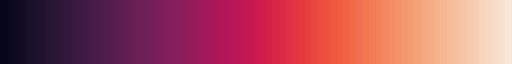

In [27]:
cmap = sns.color_palette("rocket", n_colors = len(bins))
palette = matplotlib.colors.ListedColormap(cmap)
palette

# Calculate derived parameters
## Plot b(z)

In [28]:
def b_eboss(z):
    
    return 0.278*((1+z)**2-6.565) + 2.393

def b_quaia(b_0, a, cosmo = cosmo_planck18): #quaia):
    
    return b_0/ccl.growth_factor(cosmo, a)

In [29]:
b_cf20 = np.load('../results/b_cf20_planck18.npy')
b_wp20 = np.load('../results/b_wp20_planck18.npy')

# Calculate number density as $n_q \approx \int_0^{\infty} d M \frac{d n}{d M}\langle N(M)\rangle$

In [30]:
tab_datahi_mask_zbins, selfunc_hi_bins = [], []
for j in z_array:
    
    tab_datahi_mask_zbin0, _, _, _, _, _, selfunc_hi_bin0, _, pixel_indices_datahi_bin0 = quaia.make_bins(G_hi, [j], True, ['z'], 
                                                                                     bins = [z_bins], tab_gcat_type = 'data',
                                                                                     method = ['minmax'], fac_rand = 25,
                                                                                     n_bins = [None], mask = mask*100, percentile = True)
    tab_datahi_mask_zbins.append(tab_datahi_mask_zbin0['redshift_quaia'])
    selfunc_hi_bins.append(selfunc_hi_bin0)

Pixels masked by MC but not already by selfunc: 1911
G20.5_zmin0.0zmax1.0: 0.31              223881 vs 324336
Pixels masked by MC but not already by selfunc: 3700
G20.5_zmin1.0zmax2.0: 0.28              464213 vs 648196
Pixels masked by MC but not already by selfunc: 3094
G20.5_zmin2.0zmax3.0: 0.25              213734 vs 286508
Pixels masked by MC but not already by selfunc: 350
G20.5_zmin3.0zmax4.6: 0.22              28436 vs 36458


In [31]:
n_q, n_q_err, V_eff, N_q = [], [], [], []

for j in z_array:
    
    N = len(tab_datahi_mask_zbins[j])
    cp = np.percentile(selfunc_hi_bins[j], mask*100)
    f_sky = 1/(4*np.pi)*np.sum(selfunc_hi_bins[j][selfunc_hi_bins[j]>=cp]*hp.nside2pixarea(NSIDE))
    print(f_sky) # f_sky)
    V = f_sky*(Planck18.comoving_volume(z_bins[j+1])-Planck18.comoving_volume(z_bins[j]))*Planck18.h**3/u.h**3
    N_q.append(N)
    n_q.append(N/V.value)
    n_q_err.append(np.sqrt(N)/V.value) # Poisson error
    V_eff.append(V)
    
n_q

0.3845560073799039
0.40216201738111934
0.4302131627396445
0.4406662053921837


[1.1460676322037898e-05,
 8.057535346050653e-06,
 3.0495647269572566e-06,
 2.688727754331005e-07]

## Limit scales to $30\geq s \geq 80h^{-1}$ Mpc

In [32]:
# Create the bins array
offset = 5 #2.5
delta_max = 20 #40# 64
delta_min = np.min((np.floor((30-0.15)/offset), delta_max))

rmin = 30-delta_min*offset # 0.1 # start higher # 1.4 # 30
rmax = 80+delta_max*offset # 200
nbins = int((rmax-rmin)/offset) #20 + int(delta_min+delta_max) #90 #20
rbins_chi2 = np.linspace(rmin, rmax, nbins + 1) # Mpc/h https://github.com/manodeep/Corrfunc/issues/202
scale = 'linear'
rbins_chi2, quaia.recenter(rbins_chi2), np.diff(quaia.recenter(rbins_chi2))

(array([  5.,  10.,  15.,  20.,  25.,  30.,  35.,  40.,  45.,  50.,  55.,
         60.,  65.,  70.,  75.,  80.,  85.,  90.,  95., 100., 105., 110.,
        115., 120., 125., 130., 135., 140., 145., 150., 155., 160., 165.,
        170., 175., 180.]),
 array([  7.5,  12.5,  17.5,  22.5,  27.5,  32.5,  37.5,  42.5,  47.5,
         52.5,  57.5,  62.5,  67.5,  72.5,  77.5,  82.5,  87.5,  92.5,
         97.5, 102.5, 107.5, 112.5, 117.5, 122.5, 127.5, 132.5, 137.5,
        142.5, 147.5, 152.5, 157.5, 162.5, 167.5, 172.5, 177.5]),
 array([5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
        5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.]))

## Compute the maximum number of jackknife regions

In [33]:
for j in z_array:
    
    N = len(tab_datahi_mask_zbins[j])
    cp = np.percentile(selfunc_hi_bins[j], mask*100)
    f_sky = 1/(4*np.pi)*np.sum(selfunc_hi_bins[j][selfunc_hi_bins[j]>=cp]*hp.nside2pixarea(NSIDE))
    V = f_sky*(Planck18.comoving_volume(j+1)-Planck18.comoving_volume(j))*Planck18.h**3/u.h**3
    V_jackknife = f_sky*(4/3*np.pi*(rmax**3))*V.unit
    print(np.int(V/V_jackknife), (V/25)**(1/3))

2079 921.0622735474994 Mpc / h
5864 1320.8647698576522 Mpc / h
6668 1410.0415698632053 Mpc / h
6319 1396.1231500750716 Mpc / h


In [34]:
cf_chi2, cf_matter_chi2 = [], []
yerr_cf_chi2, b_cf_chi2 = [], []
b_cf_q_chi2 = []
a_zbin = []
H0 = Planck18.H0 # cosmo_planck18['H0'] * u.km/u.s/u.Mpc
    
for j in z_array:

    tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, _ = quaia.make_bins(G_hi, [j], True, ['z'], 
                                                                                     bins = [z_bins], tab_gcat_type = 'data',
                                                                                     method = ['minmax'], fac_rand = 25,
                                                                                     n_bins = [None], mask = mask*100, percentile = True)

    # quasar correlation function
    cf, qq, qr = quaia.xi_s(tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, nthreads = nthreads, 
               rbins = rbins_chi2, Om0 = Planck18.Om0, h = Planck18.h, error = True)
    cf_chi2.append(cf)

    # scale factor
    a = a_median(tab_datahi_mask_zbin0)
    a_zbin.append(a)

    # matter correlation function
    rbins_Mpc = (quaia.recenter(rbins_chi2)*u.Mpc/cu.littleh).to(u.Mpc, cu.with_H0(H0))
    cf_matter = ccl.correlations.correlation_3d(cosmo_planck18, r=rbins_Mpc, a=a)
    cf_matter_chi2.append(cf_matter)

    # effective bias 
    b = np.sqrt(cf/cf_matter)
    b_cf_chi2.append(b)

    # yerr
    yerr=(1+cf)/np.sqrt(qq)
    yerr[cf<0]=np.sqrt((1+b**2*cf_matter)/qr)[cf<0] #https://arxiv.org/abs/1603.04849
    yerr_cf_chi2.append(yerr)

    # qso bias
    b_cf_q_chi2.append(b_qso(cf, cf_matter, ccl.growth_rate(cosmo_planck18, a)))

Pixels masked by MC but not already by selfunc: 1911
G20.5_zmin0.0zmax1.0: 0.31              223881 vs 324336


[Warning] The CPU supports AVX512F but the compiler does not.  Can you try another compiler?
/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\
/tmp/ipykernel_119335/4246606042.py:29: RuntimeWarning: invalid value encountered in sqrt
  b = np.sqrt(cf/cf_matter)
/tmp/ipykernel_119335/4043121211.py:3: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3


Pixels masked by MC but not already by selfunc: 3700
G20.5_zmin1.0zmax2.0: 0.28              464213 vs 648196


/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\
/tmp/ipykernel_119335/4246606042.py:29: RuntimeWarning: invalid value encountered in sqrt
  b = np.sqrt(cf/cf_matter)
/tmp/ipykernel_119335/4043121211.py:3: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3


Pixels masked by MC but not already by selfunc: 3094
G20.5_zmin2.0zmax3.0: 0.25              213734 vs 286508


/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\
/tmp/ipykernel_119335/4246606042.py:29: RuntimeWarning: invalid value encountered in sqrt
  b = np.sqrt(cf/cf_matter)
/tmp/ipykernel_119335/4043121211.py:3: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3


Pixels masked by MC but not already by selfunc: 350
G20.5_zmin3.0zmax4.6: 0.22              28436 vs 36458


/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\
/tmp/ipykernel_119335/4246606042.py:29: RuntimeWarning: invalid value encountered in sqrt
  b = np.sqrt(cf/cf_matter)
/tmp/ipykernel_119335/4043121211.py:3: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3


In [35]:
rpmask = (quaia.recenter(rbins_chi2) >= 30) & (quaia.recenter(rbins_chi2) <= 80)

# Perform nested sampling with dynesty

In [36]:
# Define the dimensionality of our problem.
ndim = 3

## Pick cosmology

In [37]:
cosmo = 'Planck'

In [40]:
N = 45 #85

In [41]:
# Define our 3-D correlated multivariate normal log-likelihood.
C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo)) # good
ix_grid = np.ix_(rpmask, rpmask)
    
def loglike(x, a, cf_matter, C, cf, n_q, nbins, cosmo = cosmo_planck18, error = 0.05, M_max = M_max, bins = bins):
    
    fduty, M_min, sigma = x
    
    # bins_m = np.logspace(M_min, M_max, 79)
    # n_m=HOD_scatter(10**fduty, M_min, bins_m, sigma)
    
    # bins_m = np.logspace(M_min-3*sigma/np.log(10), M_max, 79)
    n_m=HOD_scatter(10**fduty, M_min, bins, sigma)
    
    # cf_2h_zbin, _ = cf_2h(bins_m, n_m, a, cosmo, cf_matter, recenter = False)
    cf_2h_zbin, _ = cf_2h(bins, n_m, a, cosmo, cf_matter, recenter = False)
    delta = cf-cf_2h_zbin
    
    Cinv = np.linalg.inv(C)
    lnorm = -0.5 * (np.log(2 * np.pi) * nbins +
                    np.log(np.linalg.det(C)))
    
    # n_q_theory = M(bins_m, n_m, a = a, cosmo = cosmo, recenter = False)[1]
    n_q_theory = M(bins, n_m, a = a, cosmo = cosmo, recenter = False)[1]
    penalty = np.abs(n_q_theory-n_q)/n_q
    if penalty > error:
        penalty = np.inf
    # penalty = 0.5*((n_q_theory-n_q)/(error*n_q))**2
    
    return -0.5 * np.dot(delta, np.dot(Cinv, delta)) + lnorm - penalty

In [42]:
def ptform(u):
    """Transforms the uniform random variables `u ~ Unif[0., 1.)`
    to the parameters of interest."""

    x = np.array(u)  # copy u 

    # Uniform from -6 to 0
    x[0] = 6* u[0] - 6 # scale and shift to [-6., 0.)

    # Uniform from 9 to 15
    x[1] = 6 * u[1] + 9  # scale and shift to [9., 15.)
    
    # Uniform from 0 to 1.4
    x[2] = 1.4 * u[2]  # scale to [0., 1.4.)

    return x

In [43]:
# initialize our nested sampler
sampler = NestedSampler(loglike, ptform, ndim, logl_args=[a_zbin[j], cf_matter_chi2[j][rpmask], C[ix_grid], cf_chi2[j][rpmask], n_q[j], nbins])

In [44]:
# run the sampler with checkpointing
sampler.run_nested(dlogz = 0.005)
results = sampler.results

150it [00:06, 36.28it/s, bound: 10 | nc: 40 | ncall: 29246 | eff(%):  0.513 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.005] /home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined from bootstrapping is very large. If you are using uniform sampling that may mean that the sampling will be inefficient. This may be caused by a very complex posterior shape. You may consider using more livepoints or different sampler (i.e. rslice or rwalk) or alternatively disable bootstrap (bootstrap=0)
  warnings.warn(
3448it [00:58, 58.51it/s, +500 | bound: 93 | nc: 1 | ncall: 73416 | eff(%):  5.414 | loglstar:   -inf < -4.964 <    inf | logz: -11.174 +/-    nan | dlogz:  0.000 >  0.005]


In [45]:
# Print out a summary of the results.
results.summary()

Summary
nlive: 500
niter: 3448
ncall: 50416
eff(%):  5.414
logz: -11.174 +/-  0.107


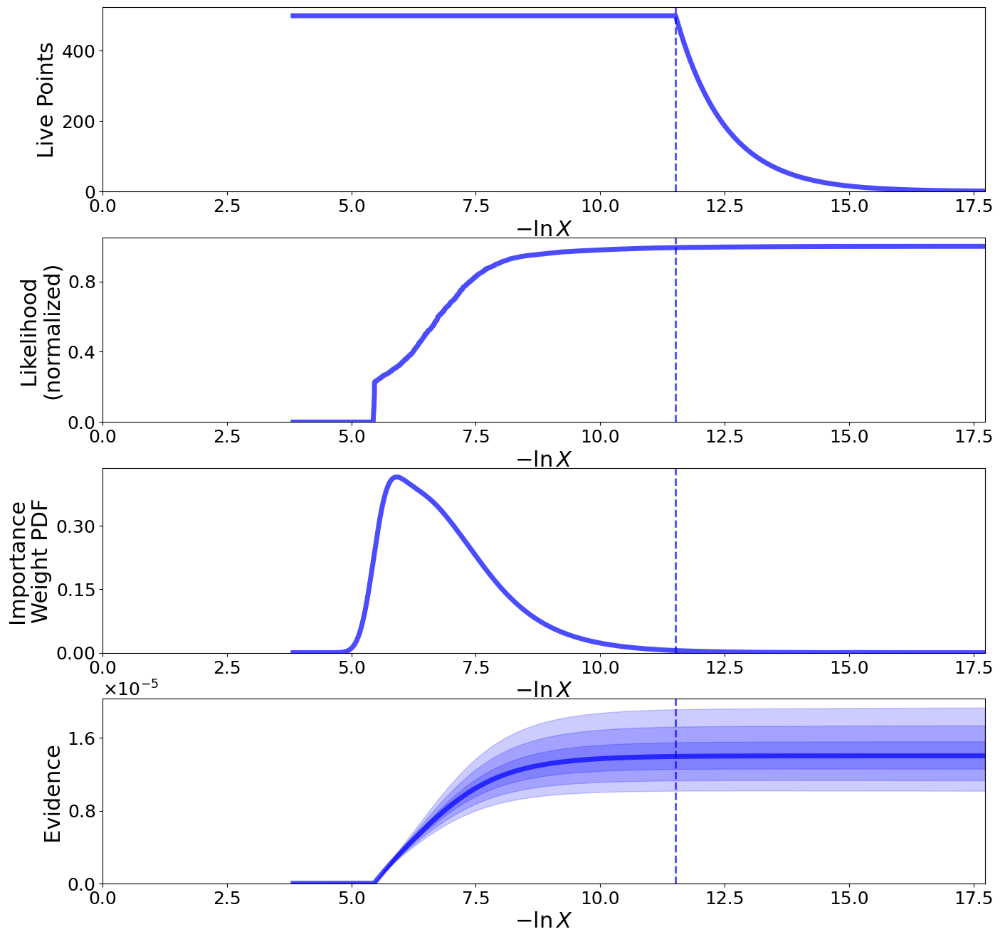

In [46]:
fig, axes = dyplot.runplot(results)  # summary (run) plot
fig.subplots_adjust(hspace=0.25)

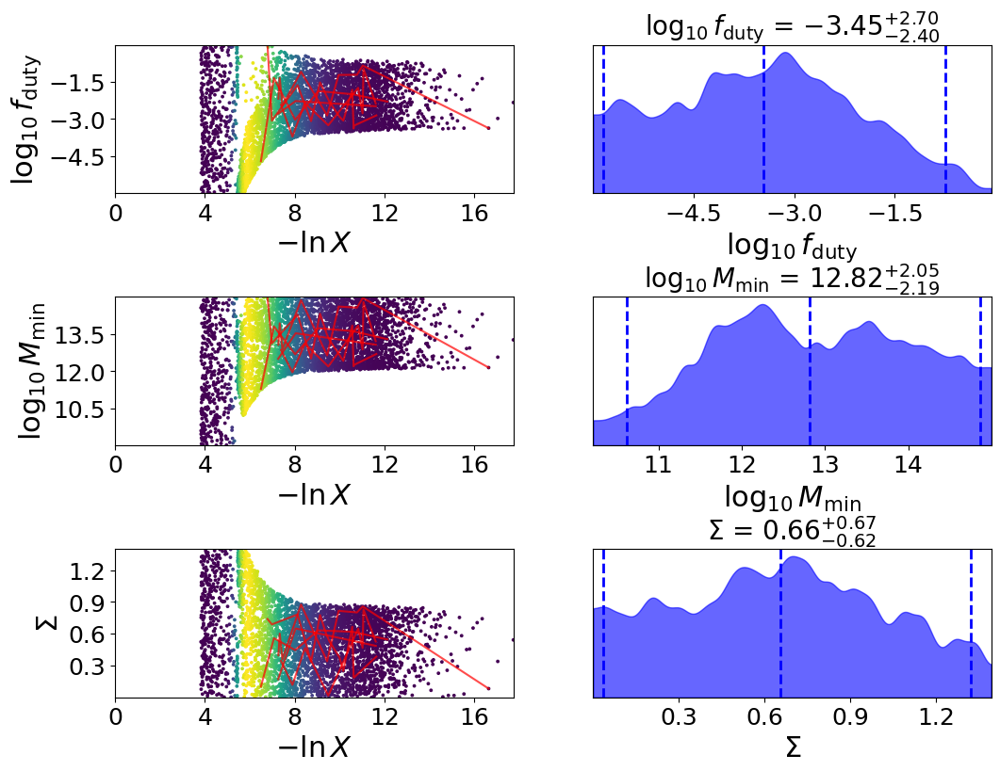

In [47]:
fig, axes = dyplot.traceplot(results, 
                             show_titles=True,
                             trace_cmap='viridis', connect=True,
                             connect_highlight=range(5), labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'])
fig.subplots_adjust(hspace=0.7)

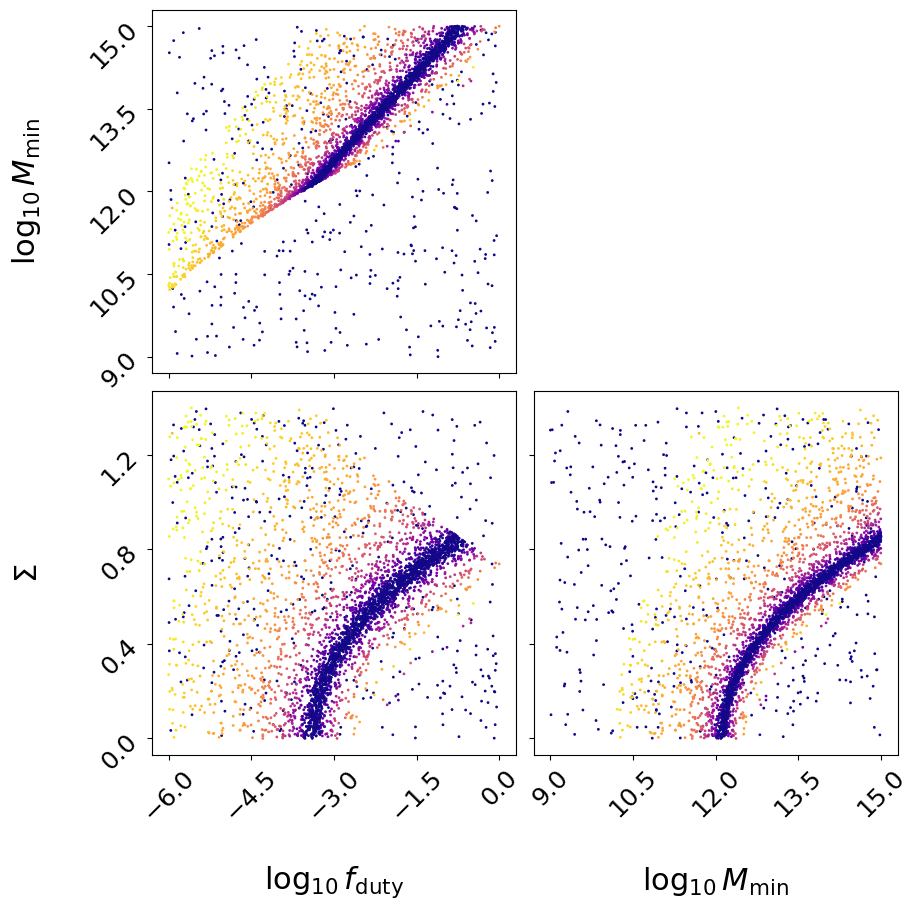

In [48]:
# initialize figure
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# plot initial run (res1; left)
fg, ax = dyplot.cornerpoints(results, cmap='plasma',
                             kde=False, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'], fig=(fig, axes))

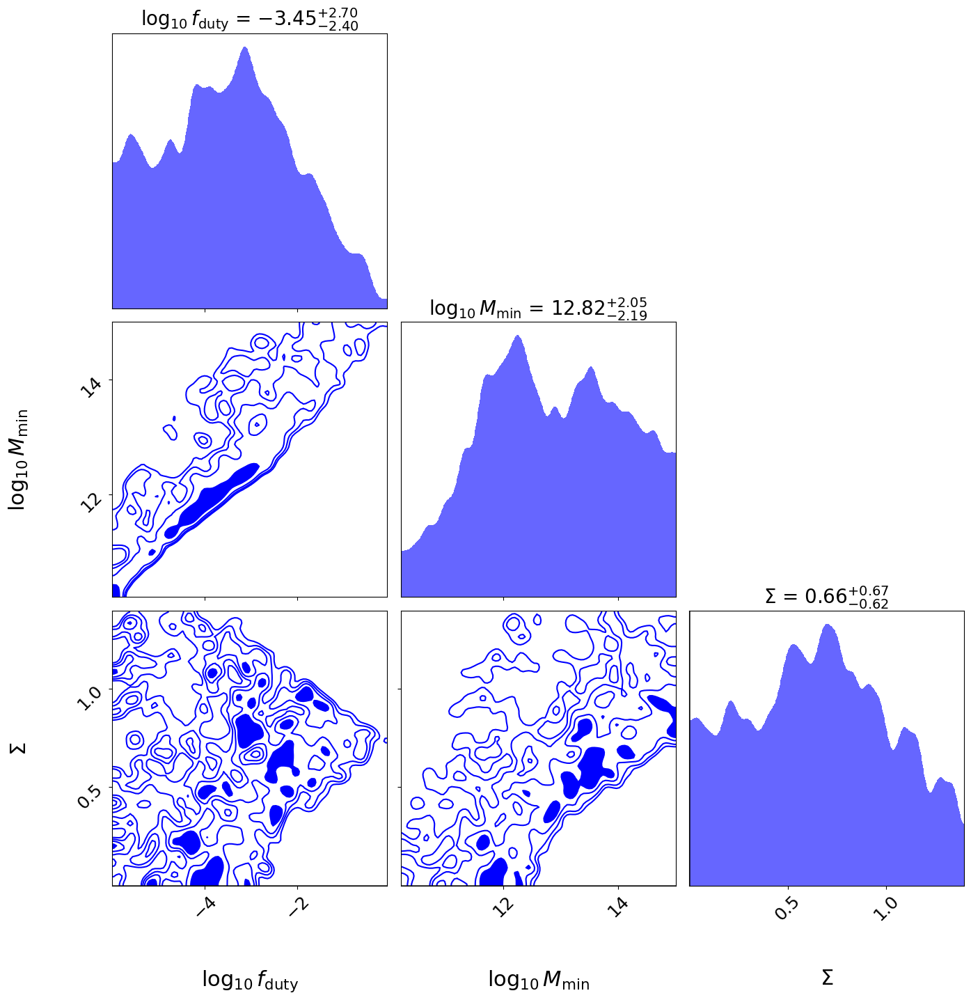

In [49]:
# # initialize figure
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# plot initial run (res1; left)
fg, ax = dyplot.cornerplot(results, color='blue', truths=np.zeros(ndim),
                           truth_color='black', show_titles=True,
                           max_n_ticks=3, quantiles=None, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'], fig=(fig, axes[:, :3]))

In [50]:
samples, weights = results.samples, results.importance_weights()
mean, cov = dyfunc.mean_and_cov(samples, weights)
print(mean, cov)

[-3.47500257 12.8353866   0.65510031] [[1.9253868  1.34917356 0.01531517]
 [1.34917356 1.40588171 0.24144308]
 [0.01531517 0.24144308 0.12980119]]


In [51]:
# Compute weighted quantiles
samples, weights = results.samples, results.importance_weights()

# Get median and 1-sigma (16th, 50th, 84th percentiles) for each parameter
quantiles = [dyfunc.quantile(samples[:, i], [0.025, 0.5, 0.975], weights=weights) 
             for i in range(samples.shape[1])]
labels = ['log10(f_duty)', 'log10(M_min)', 'sigma']

for i, (lo, mid, hi) in enumerate(quantiles):
    print(f"{labels[i]}: {mid:.2f} + {hi-mid:.2f}/-{mid-lo:.2f}")

log10(f_duty): -3.45 + 2.70/-2.40
log10(M_min): 12.82 + 2.05/-2.19
sigma: 0.66 + 0.67/-0.62


## Across all $z$

4565it [00:41, 108.76it/s, +500 | bound: 67 | nc: 1 | ncall: 51541 | eff(%):  9.923 | loglstar:   -inf <  7.412 <    inf | logz: -0.720 +/-    nan | dlogz:  0.000 >  0.005]


Summary
nlive: 500
niter: 4565
ncall: 34541
eff(%):  9.923
logz: -0.720 +/-  0.125
0<z<=1
log10(f_duty): -2.26 + 0.60/-0.35
log10(M_min): 13.00 + 1.25/-0.77
sigma: 0.66 + 0.36/-0.44



4678it [00:58, 80.43it/s, +500 | bound: 90 | nc: 1 | ncall: 64819 | eff(%):  8.050 | loglstar:   -inf < 19.937 <    inf | logz: 11.557 +/-    nan | dlogz:  0.000 >  0.005] 


Summary
nlive: 500
niter: 4678
ncall: 47319
eff(%):  8.050
logz: 11.557 +/-  0.127
1<z<=2
log10(f_duty): -2.36 + 0.80/-0.43
log10(M_min): 12.87 + 1.40/-0.78
sigma: 0.63 + 0.36/-0.41



4409it [00:50, 51.00it/s, bound: 81 | nc: 91 | ncall: 59306 | eff(%):  7.434 | loglstar:   -inf < 14.077 <    inf | logz:  5.560 +/-    nan | dlogz:  0.010 >  0.005]    /home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined from bootstrapping is very large. If you are using uniform sampling that may mean that the sampling will be inefficient. This may be caused by a very complex posterior shape. You may consider using more livepoints or different sampler (i.e. rslice or rwalk) or alternatively disable bootstrap (bootstrap=0)
  warnings.warn(
4673it [00:57, 43.17it/s, bound: 91 | nc: 7 | ncall: 64615 | eff(%):  7.232 | loglstar:   -inf < 14.080 <    inf | logz:  5.564 +/-    nan | dlogz:  0.006 >  0.005]  /home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined from bootstra

Summary
nlive: 500
niter: 4734
ncall: 49742
eff(%):  7.842
logz:  5.570 +/-  0.128
2<z<=3
log10(f_duty): -1.90 + 0.93/-0.67
log10(M_min): 13.23 + 1.22/-0.90
sigma: 0.58 + 0.26/-0.37



3447it [01:10, 48.85it/s, +500 | bound: 113 | nc: 1 | ncall: 80408 | eff(%):  4.939 | loglstar:   -inf < -4.964 <    inf | logz: -11.065 +/-    nan | dlogz:  0.000 >  0.005]


Summary
nlive: 500
niter: 3447
ncall: 59908
eff(%):  4.939
logz: -11.065 +/-  0.106
3<z<=4
log10(f_duty): -3.51 + 1.53/-1.43
log10(M_min): 12.78 + 1.44/-1.24
sigma: 0.65 + 0.39/-0.40



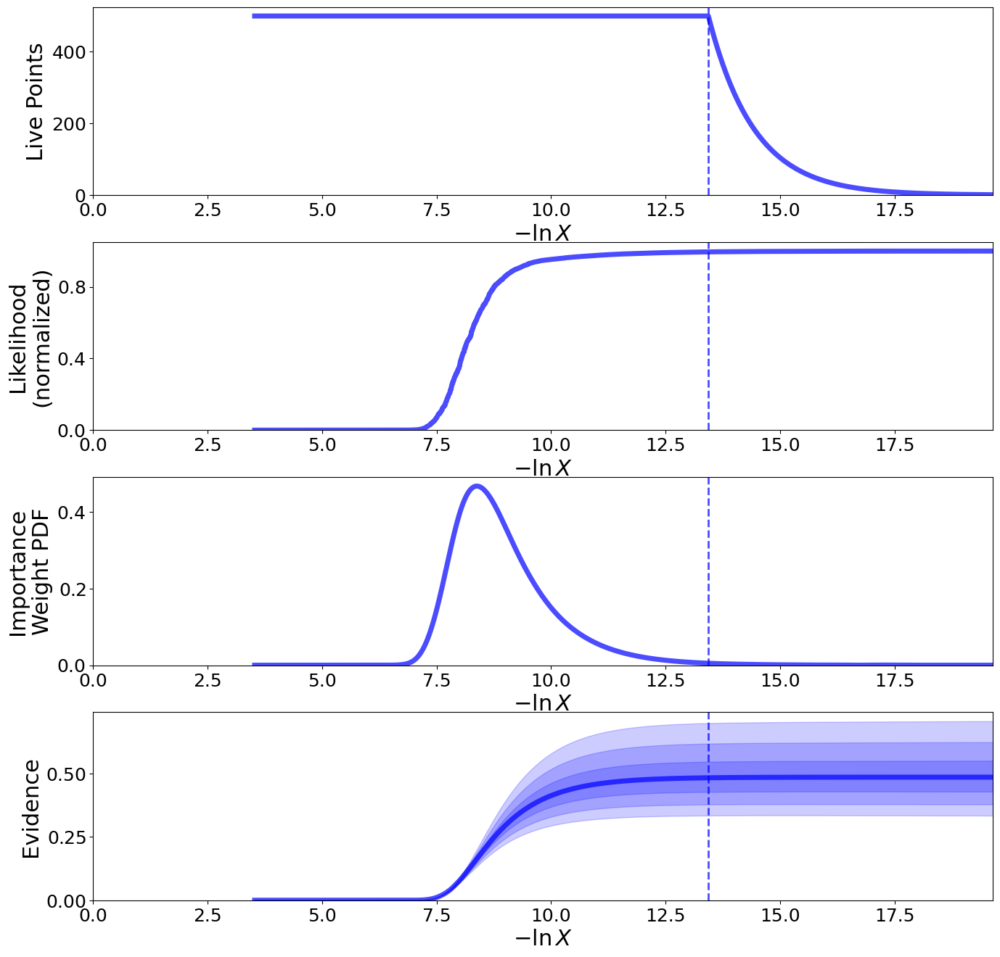

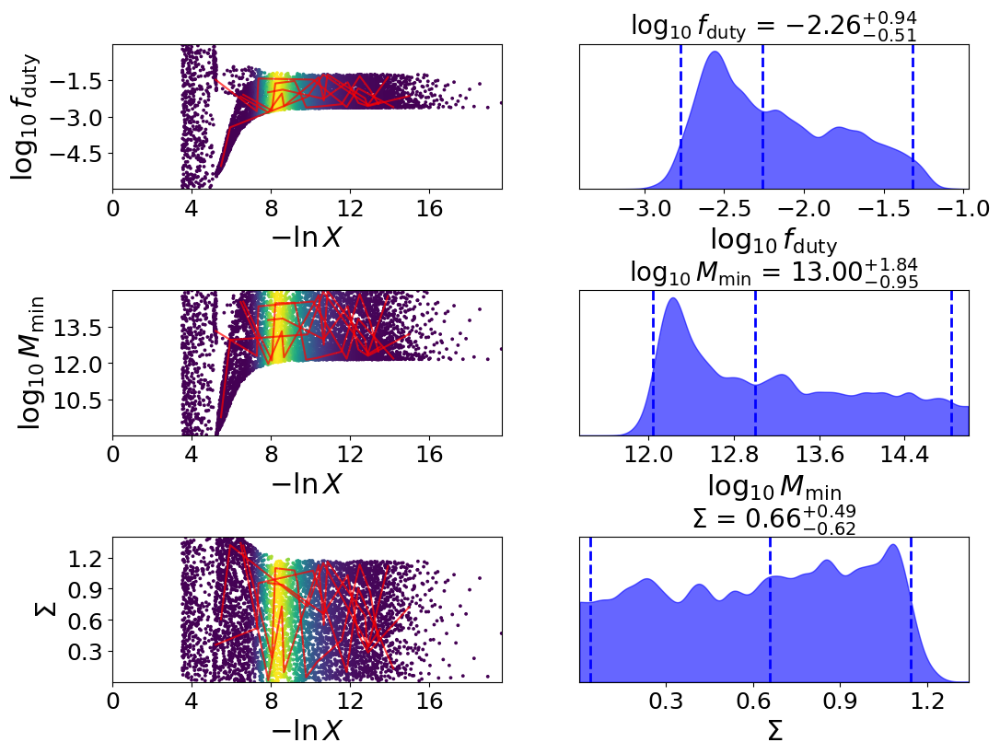

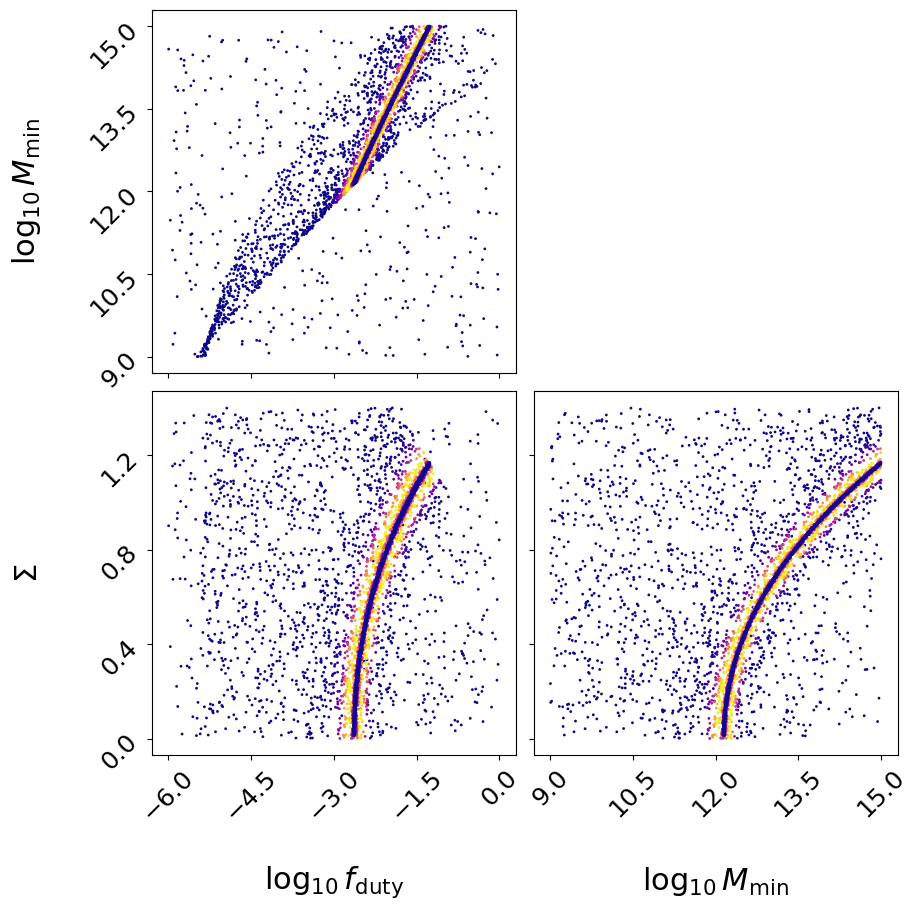

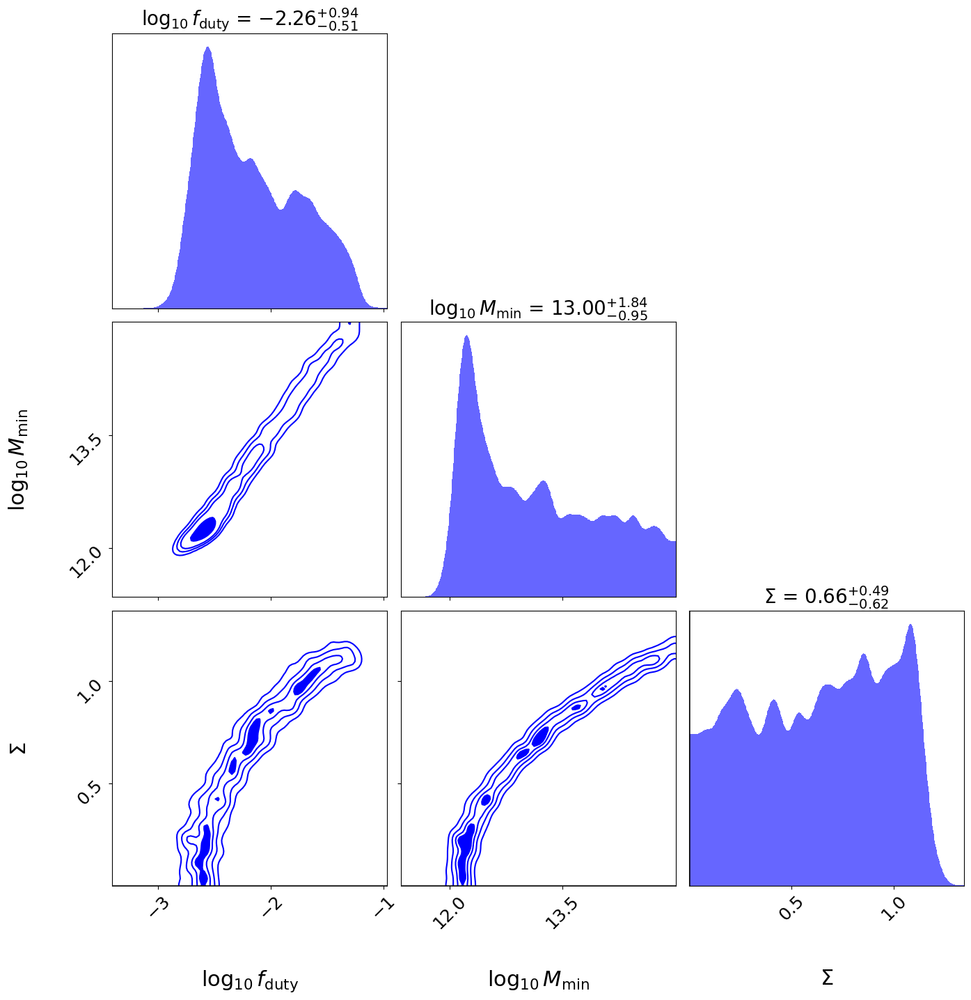

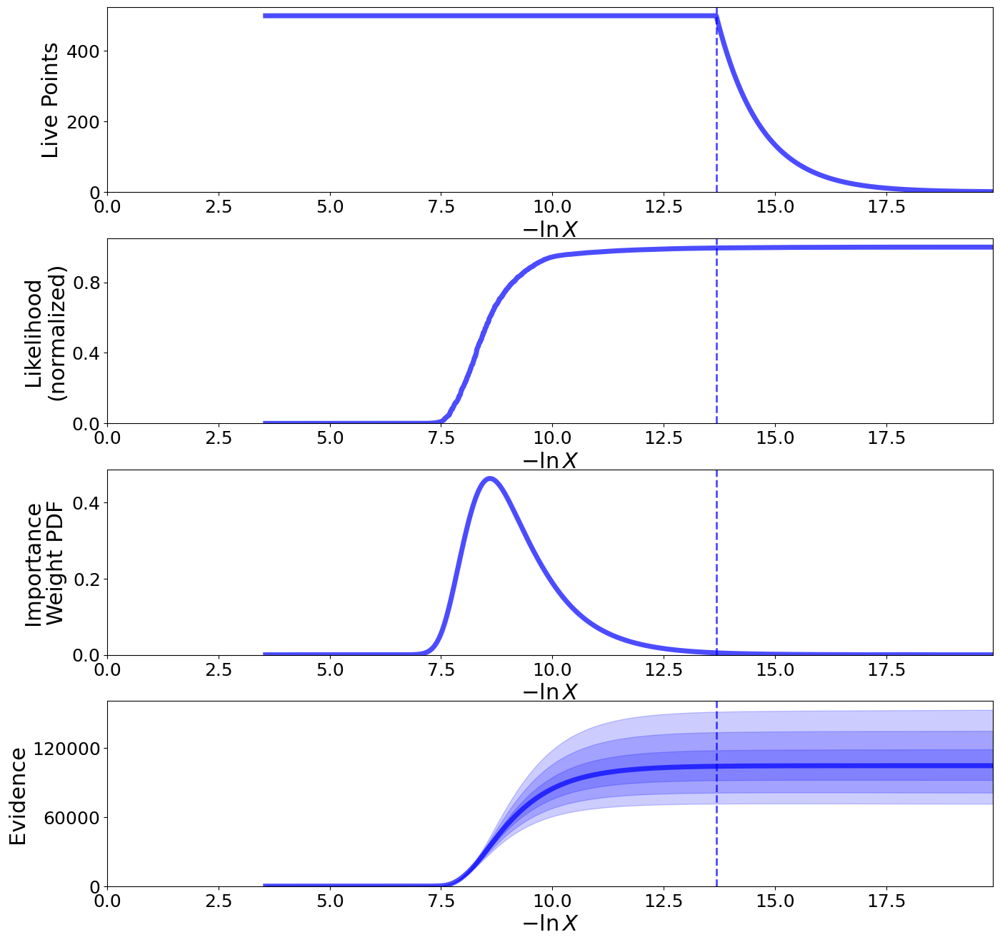

...

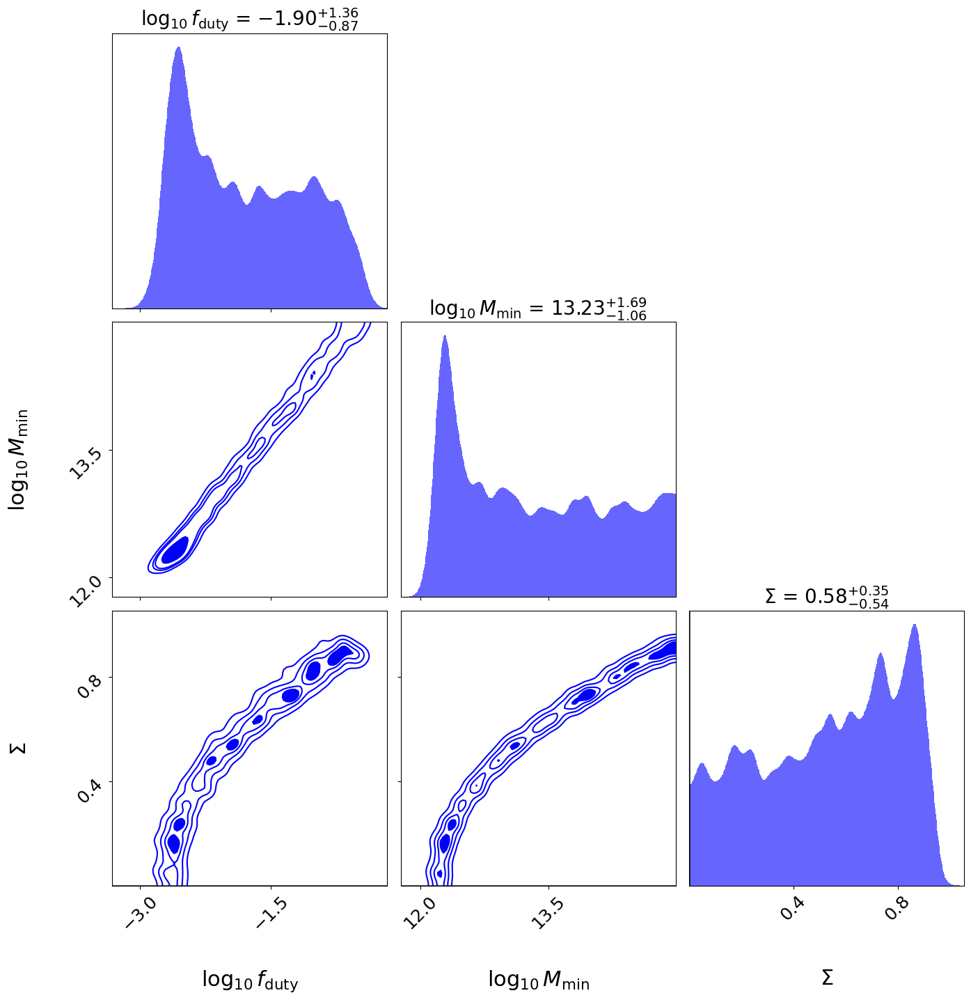

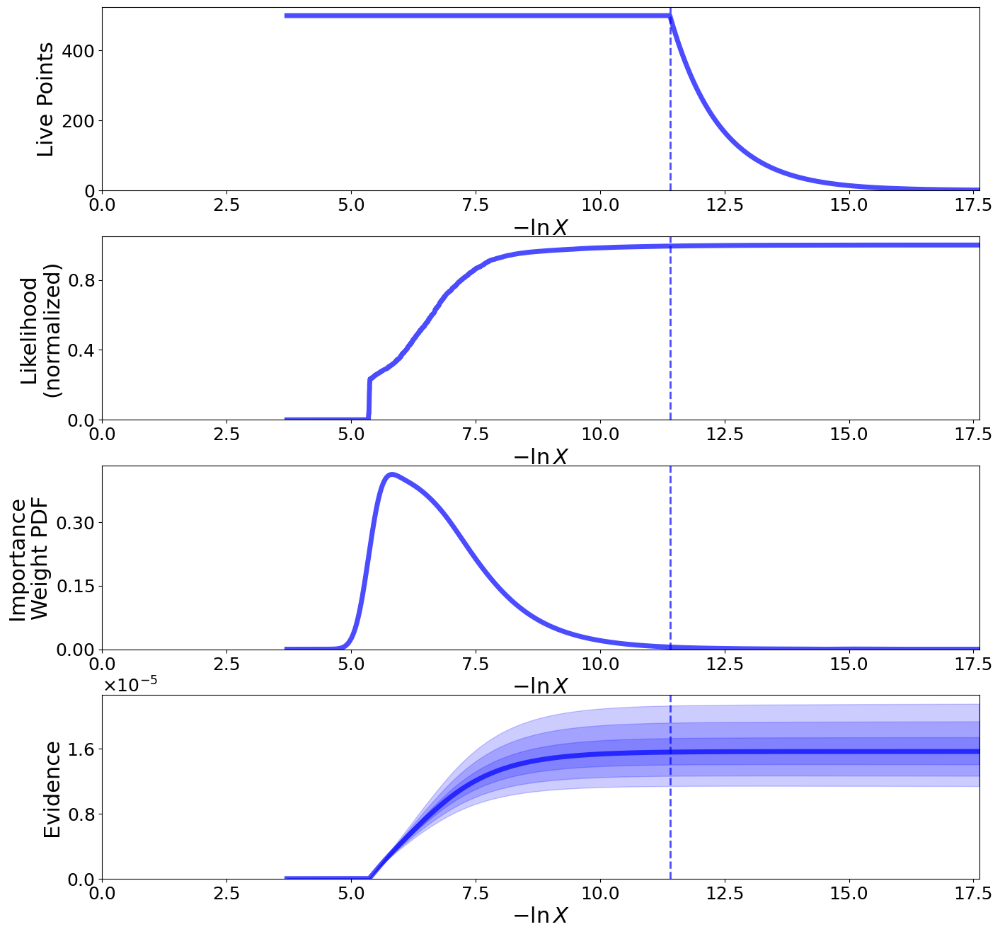

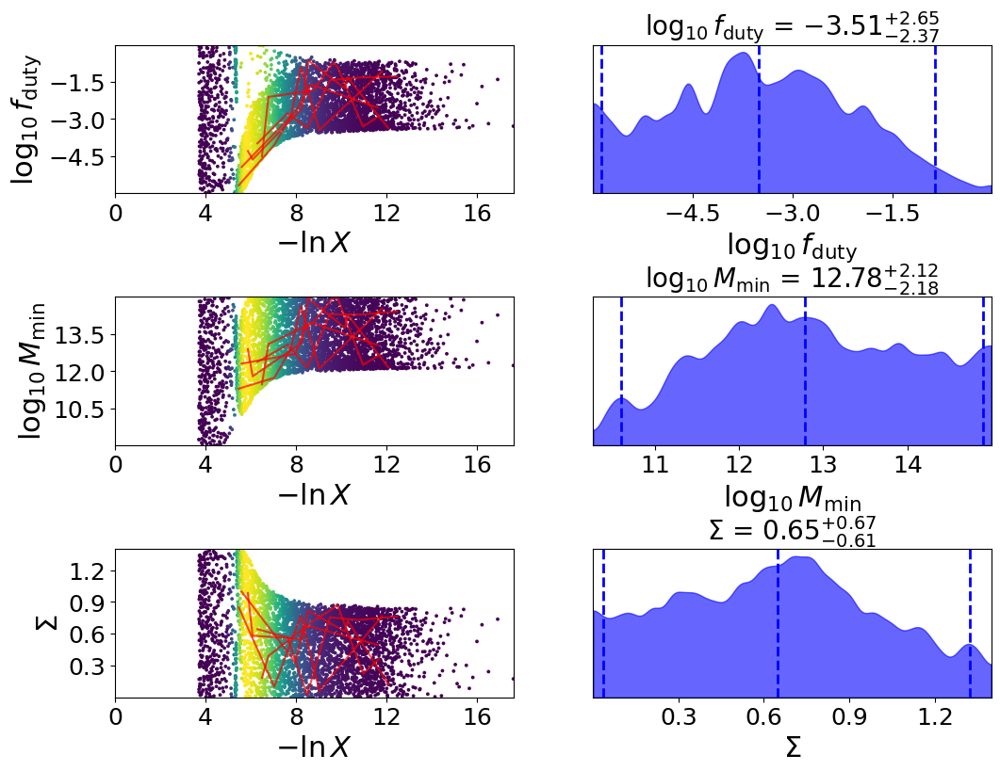

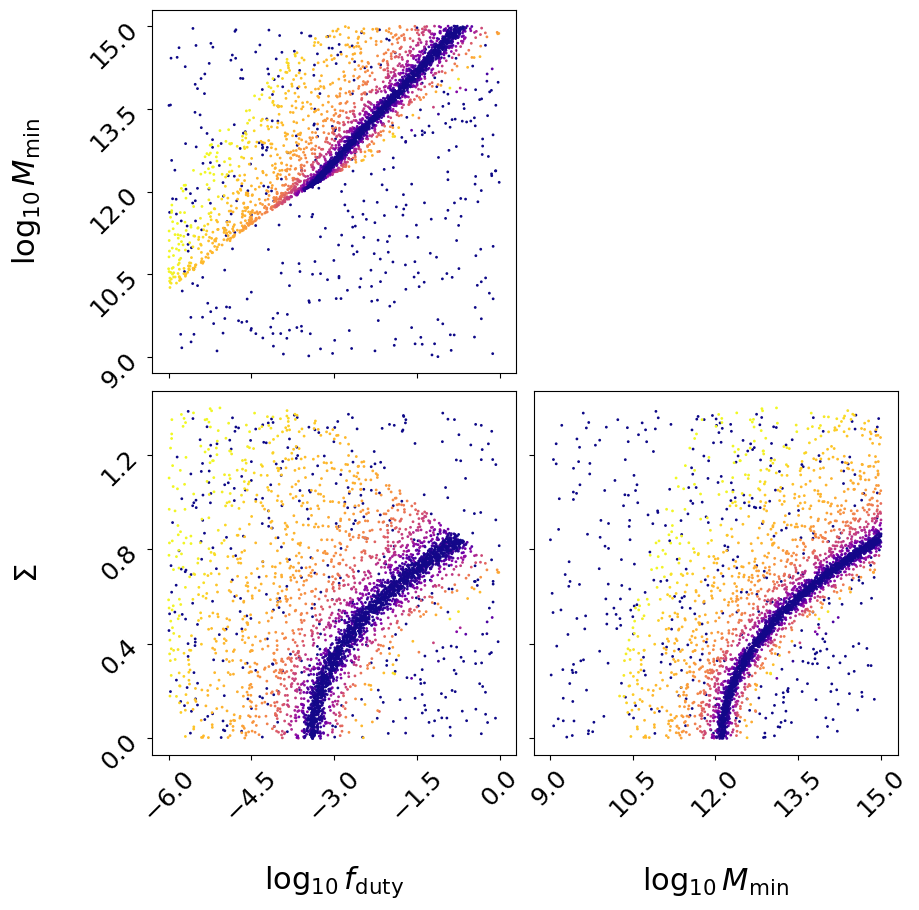

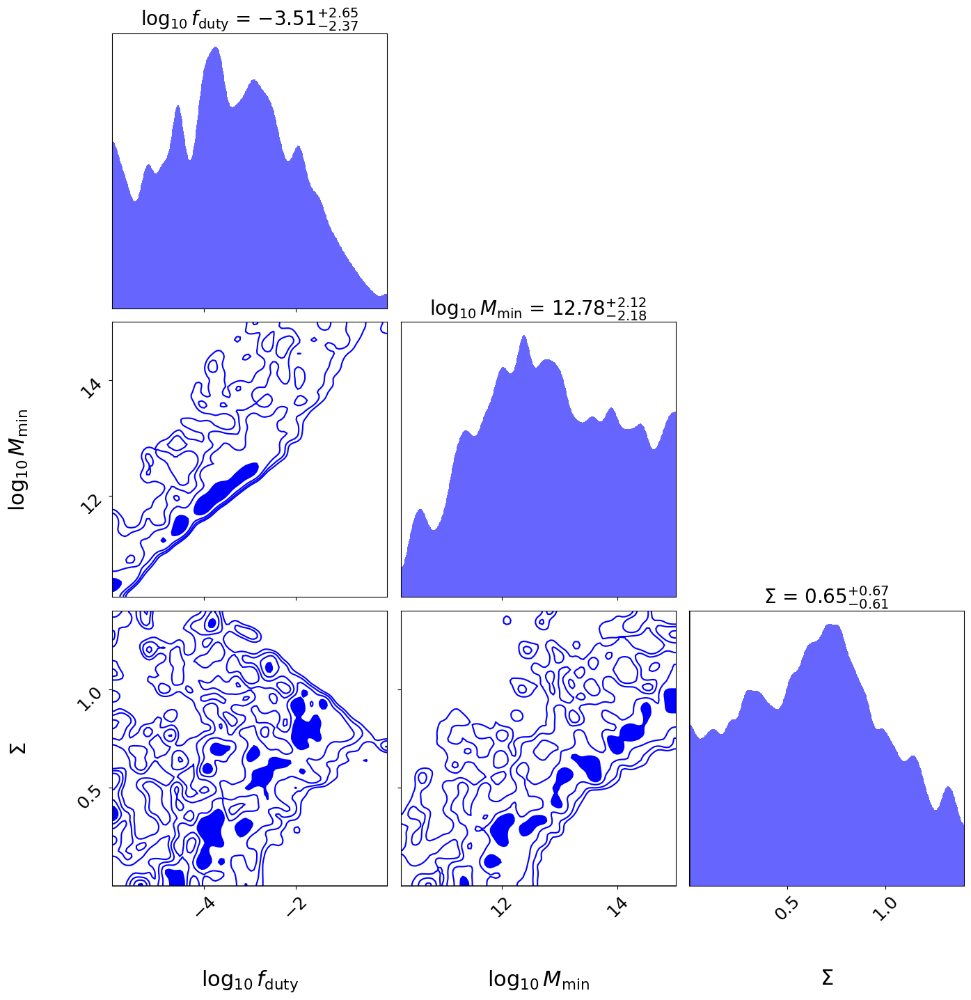

In [52]:
f_duty, M_min, sigma = [], [], []
labels = ['log10(f_duty)', 'log10(M_min)', 'sigma']
err = {i: [] for i in labels}
f_duty_samples, M_min_samples, sigma_samples = [], [], []
for j in z_array:

    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo)) # good
    ix_grid = np.ix_(rpmask, rpmask)

    # initialize our nested sampler
    sampler = NestedSampler(loglike, ptform, ndim, logl_args=[a_zbin[j], cf_matter_chi2[j][rpmask], C[ix_grid], cf_chi2[j][rpmask], n_q[j], nbins])
    
    # run the sampler with checkpointing
    sampler.run_nested(dlogz = 0.005)
    results = sampler.results
    
    # Print out a summary of the results.
    results.summary()
    
    fig, axes = dyplot.runplot(results)  # summary (run) plot
    fig.subplots_adjust(hspace=0.25)
    
    fig, axes = dyplot.traceplot(results, 
                                 show_titles=True,
                                 trace_cmap='viridis', connect=True,
                                 connect_highlight=range(5), labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'])
    fig.subplots_adjust(hspace=0.7)
    
    # initialize figure
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))

    # plot initial run (res1; left)
    fg, ax = dyplot.cornerpoints(results, cmap='plasma',
                                 kde=False, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'], fig=(fig, axes))
    
    ## # initialize figure
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    # plot initial run (res1; left)
    fg, ax = dyplot.cornerplot(results, color='blue', truths=np.zeros(ndim),
                               truth_color='black', show_titles=True,
                               max_n_ticks=3, quantiles=None, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'], fig=(fig, axes[:, :3]))
    
    samples, weights = results.samples, results.importance_weights()

    # Get median and 1-sigma (16th, 50th, 84th percentiles) for each parameter
    quantiles = [dyfunc.quantile(samples[:, i], [0.16, 0.5, 0.84], weights=weights) 
                 for i in range(samples.shape[1])]

    print('{}<z<={}'.format(j, j+1))
    for i, (lo, mid, hi) in enumerate(quantiles):
        print(f"{labels[i]}: {mid:.2f} + {hi-mid:.2f}/-{mid-lo:.2f}")
        err[labels[i]].append((lo, hi))
    print()
    
    equal_weight_samples = dyfunc.resample_equal(samples, weights)
    ind = np.random.choice(range(len(equal_weight_samples)), size = 1000, replace = False)
    f_duty_samples.append(equal_weight_samples[ind][:,0])
    M_min_samples.append(equal_weight_samples[ind][:,1])
    sigma_samples.append(equal_weight_samples[ind][:,2])
    
    f_duty.append(quantiles[0][1])
    M_min.append(quantiles[1][1]) 
    sigma.append(quantiles[2][1]) 

## Plot results

In [53]:
zbin = 1/np.array(a_zbin)-1

In [54]:
z_eff = [0.5, 1.5, 2.5, 3.5]

<>:5: SyntaxWarning: invalid escape sequence '\l'
<>:5: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_119335/504814621.py:5: SyntaxWarning: invalid escape sequence '\l'
  plt.ylabel('$\log_{10}(M_{min}/M_\odot)$')


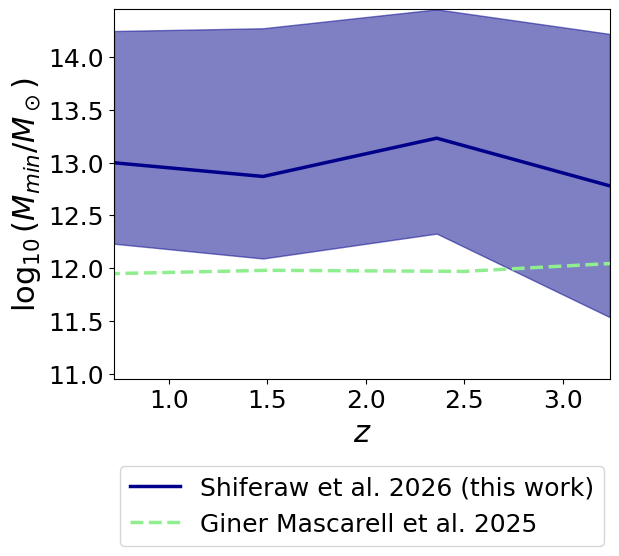

In [55]:
M_min_lo, M_min_hi = np.array(err['log10(M_min)'])[:,0], np.array(err['log10(M_min)'])[:,1]
plt.plot(zbin, M_min, color = 'darkblue', linewidth = 2.5, label = 'Shiferaw et al. 2026 (this work)')
plt.fill_between(zbin, M_min_lo, M_min_hi, alpha = 0.5, color = 'darkblue')
plt.plot(z_eff, M_min_array, label = 'Giner Mascarell et al. 2025', color = 'lightgreen', linewidth = 2.5, linestyle = '--')
plt.ylabel('$\log_{10}(M_{min}/M_\odot)$')
plt.xlabel('$z$')
plt.legend(bbox_to_anchor = (0.5, -0.2), loc='upper center')
plt.xlim(zbin[0], zbin[-1])
plt.ylim(10.95,14.45)
plt.show()

In [56]:
f_duty_giner = [0.001986832927349008, 0.001968631474455283, 0.002978657298062041, 0.001968631474455283]

<>:5: SyntaxWarning: invalid escape sequence '\l'
<>:5: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_119335/3759337069.py:5: SyntaxWarning: invalid escape sequence '\l'
  plt.ylabel('$\log_{10}(f_{duty})$')


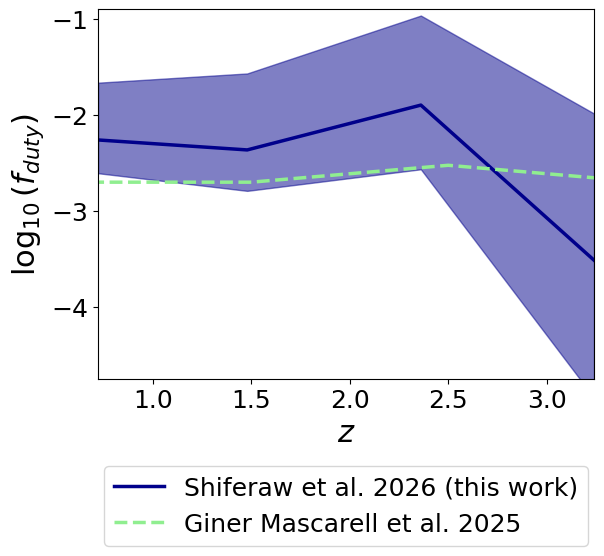

In [57]:
f_duty_lo, f_duty_hi = np.array(err['log10(f_duty)'])[:,0], np.array(err['log10(f_duty)'])[:,1]
plt.plot(zbin, f_duty, color = 'darkblue', linewidth = 2.5, label = 'Shiferaw et al. 2026 (this work)')
plt.fill_between(zbin, f_duty_lo, f_duty_hi, alpha = 0.5, color = 'darkblue')
plt.plot(z_eff, np.log10(fduty), label = 'Giner Mascarell et al. 2025', color = 'lightgreen', linewidth = 2.5, linestyle = '--')
plt.ylabel('$\log_{10}(f_{duty})$')
plt.xlabel('$z$')
plt.legend(bbox_to_anchor = (0.5, -0.2), loc='upper center')
plt.xlim(zbin[0], zbin[-1])
plt.ylim(-4.75,-0.9)
plt.show()

<>:4: SyntaxWarning: invalid escape sequence '\S'
<>:4: SyntaxWarning: invalid escape sequence '\S'
/tmp/ipykernel_119335/4033427860.py:4: SyntaxWarning: invalid escape sequence '\S'
  plt.ylabel('$\Sigma$')


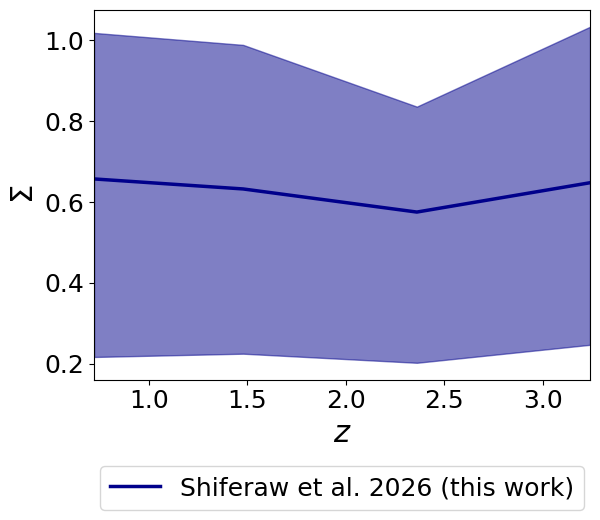

In [58]:
sigma_lo, sigma_hi = np.array(err['sigma'])[:,0], np.array(err['sigma'])[:,1]
plt.plot(zbin, sigma, color = 'darkblue', linewidth = 2.5, label = 'Shiferaw et al. 2026 (this work)')
plt.fill_between(zbin, sigma_lo, sigma_hi, alpha = 0.5, color = 'darkblue')
plt.ylabel('$\Sigma$')
plt.xlabel('$z$')
plt.legend(bbox_to_anchor = (0.5, -0.2), loc='upper center')
plt.xlim(zbin[0], zbin[-1])
# plt.ylim(-4.75,-1.7)
plt.show()

In [59]:
b_eff_cf20 = np.load('../results/b_eff_cf20_planck18.npy')

## Calculate 16th and 84th percentile of derived parameters

<>:73: SyntaxWarning: invalid escape sequence '\l'
<>:73: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_119335/4016273517.py:73: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))


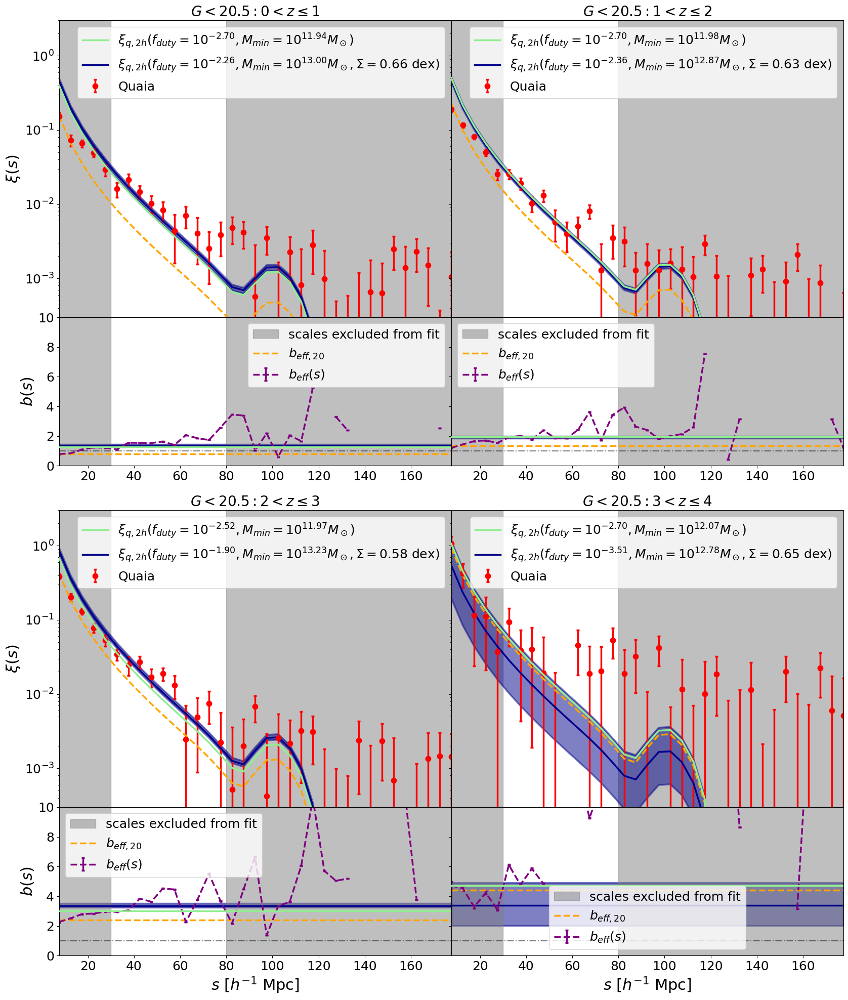

In [60]:
fig = plt.figure(figsize = (20, 24))
gs = gridspec.GridSpec(5, 2, height_ratios = [1, 0.5, 0.15, 1, 0.5], hspace = 0, wspace = 0)

k = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j+k])
    ax2 = fig.add_subplot(gs[j+k+2])
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], 
                                                                                                    N, cosmo)) # good
    
    ax1.errorbar(quaia.recenter(rbins_chi2), cf_chi2[j], linewidth = 2.5, marker = 'o', label = r'Quaia', color = 'red',
                yerr = np.sqrt(np.diag(C)), markeredgewidth = 2.5, capsize = 2.5, linestyle = 'none')
    ax1.plot(quaia.recenter(rbins_chi2), b_eff_cf20[j]**2*cf_matter_chi2[j], linewidth = 2.5,
             # label = r'${b_{eff, 20}}^2\xi_m$', 
             color = 'orange', linestyle = '--')
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                      alpha = 0.5)
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                      alpha = 0.5)

    # old fit
    cf_2h_zbin, b_q = cf_2h(bins_M_min[j], n_m_array[j], a_zbin[j], cosmo_planck18, cf_matter_chi2[j], recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5, 
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot)$'.format(np.log10(fduty[j]), M_min_array[j]),
             color = 'lightgreen', zorder = 3)
    ax2.axhline(b_q, linewidth = 2.5, color = 'lightgreen', zorder = 3)

    # plot new fit
    # bins_m = np.logspace(M_min[j],M_max,79)
    # bins_m = np.logspace(M_min[j]-3*sigma[j]/np.log(10),M_max,79)
    # n_m=HOD_scatter(10**f_duty[j], M_min[j], bins_m, sigma[j])
    # cf_2h_zbin, b_q = cf_2h(bins_m, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                         recenter = False)
    n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j])
    cf_2h_zbin, b_q = cf_2h(bins, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot, \Sigma={:.2f}$ dex)'.format(f_duty[j], M_min[j], 
                                                                                                                           sigma[j]), 
             color = 'darkblue')
    
    cf_2h_samples, b_q_samples=[], []
    for i in range(len(ind)):
        # bins_m = np.logspace(M_min_samples[j][i],M_max,79)
        # bins_m = np.logspace(M_min[j]-3*sigma_samples[j][i]/np.log(10),M_max,79)
        # n_m=HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins_m, sigma_samples[j][i])
        # cf_2h_sample, b_q_sample = cf_2h(bins_m, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
        #                         recenter = False)
        n_m=HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i])
        cf_2h_sample, b_q_sample = cf_2h(bins, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)
        cf_2h_samples.append(cf_2h_sample)
        b_q_samples.append(b_q_sample)
    cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
    b_q_16, b_q_50, b_q_84 = np.percentile(b_q_samples, [16, 50, 84])

    ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_16, cf_2h_84, linewidth = 2.5, alpha = 0.5,
             color = 'darkblue')
    ax2.axhline(b_q, linewidth = 2.5, color = 'darkblue')
    ax2.fill_between(quaia.recenter(rbins_chi2), [b_q_16]*nbins, [b_q_84]*nbins, linewidth = 2.5, color = 'darkblue', alpha = 0.5)

    ax2.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                      alpha = 0.5, label = 'scales excluded from fit')
    ax2.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                      alpha = 0.5)
    ax2.errorbar(quaia.recenter(rbins_chi2), b_cf_chi2[j], linewidth = 2.5, linestyle = '--', markeredgewidth = 2.5, capsize = 2.5,
                 color = 'purple', yerr = np.sqrt(np.diag(C)), label = '$b_{eff}(s)$')
    ax2.axhline(b_eff_cf20[j], linewidth = 2.5, color = 'orange', linestyle = '--', label = r'${b_{eff, 20}}$')
    
    if (j + k) % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_xticklabels([])
    ax1.set_ylim(3e-4, 3)
    ax1.legend()

    ax2.axhline(1, linestyle = '-.', color = 'black', alpha = 0.5)
    ax2.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax2.set_ylim(0, 10)
    ax2.legend()
    
    if (j+k) % 2 == 0:
        ax1.set_ylabel(r'$\xi(s)$')
        ax2.set_ylabel(r'$b(s)$')

    else:
        ax1.set_yticklabels([])
        ax2.set_yticklabels([])

    if k != 0:
        ax2.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j % 2 != 0:
        k+=4

plt.show()

<>:52: SyntaxWarning: invalid escape sequence '\l'
<>:52: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_119335/4206410489.py:52: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))


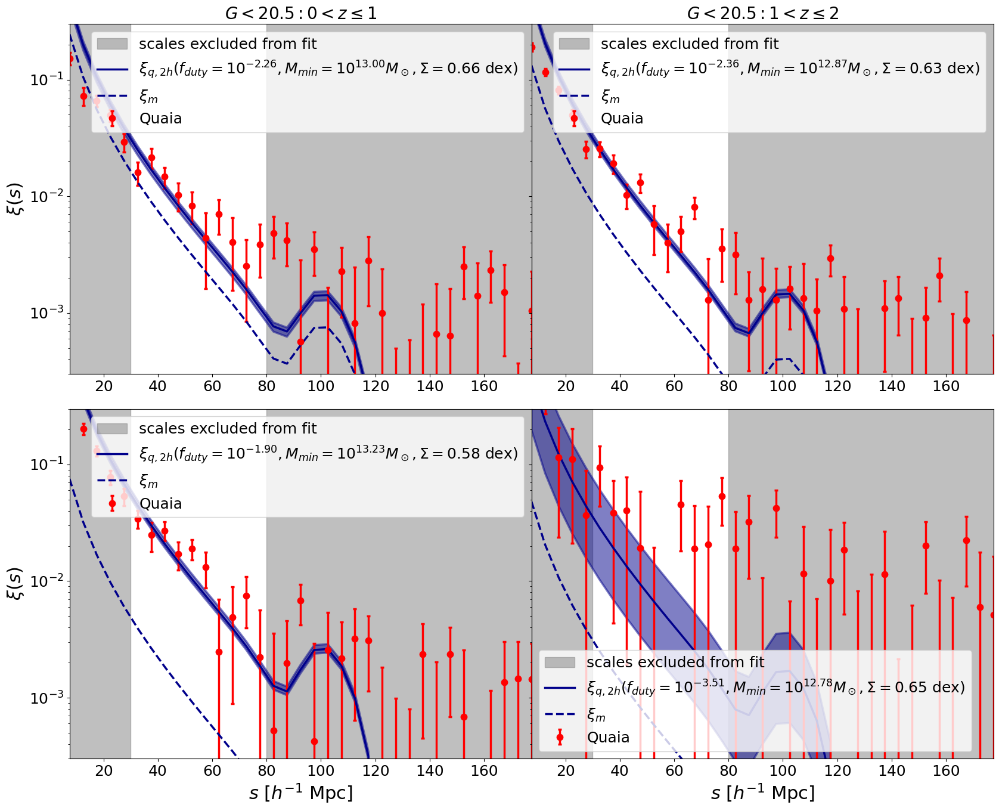

In [61]:
# remove bottom panel and just print bq somewhere
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, hspace = 0.1, wspace = 0)

k = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j])
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], 
                                                                                                    N, cosmo)) # good
    
    ax1.errorbar(quaia.recenter(rbins_chi2), cf_chi2[j], linewidth = 2.5, marker = 'o', label = r'Quaia', color = 'red',
                yerr = np.sqrt(np.diag(C)), markeredgewidth = 2.5, capsize = 2.5, linestyle = 'none')
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                      alpha = 0.5, label = 'scales excluded from fit')
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                      alpha = 0.5)

    # plot new fit
    # bins_m = np.logspace(M_min[j],M_max,79)
    # bins_m = np.logspace(M_min[j]-3*sigma[j]/np.log(10),M_max,79)
    # n_m=HOD_scatter(10**f_duty[j], M_min[j], bins_m, sigma[j])
    # cf_2h_zbin, b_q = cf_2h(bins_m, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                         recenter = False)
    n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j])
    cf_2h_zbin, b_q = cf_2h(bins, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot, \Sigma={:.2f}$ dex)'.format(f_duty[j], M_min[j], 
                                                                                                                           sigma[j]), 
             color = 'darkblue')
    ax1.plot(quaia.recenter(rbins_chi2), cf_matter_chi2[j], linewidth = 2.5,
             label = r'$\xi_{{m}}$', linestyle = '--', 
             color = 'darkblue')

    # cf_2h_samples=[]
    # for i in range(len(ind)):
    #     # bins_m = np.logspace(M_min_samples[j][i],M_max,79)
    #     bins_m = np.logspace(M_min_samples[j][i]-3*sigma_samples[j][i]/np.log(10),M_max,79)
    #     n_m=HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins_m, sigma_samples[j][i])
    #     cf_2h_sample, b_q_sample = cf_2h(bins_m, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                             recenter = False)
    #     cf_2h_samples.append(cf_2h_sample)
    cf_2h_samples = [cf_2h(bins, HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i]), a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)[0] for i in range(len(ind))]
    cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
    ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_16, cf_2h_84, linewidth = 2.5, alpha = 0.5,
             color = 'darkblue')

    if j % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_ylim(3e-4, 3e-1)
    ax1.legend()
    
    if j % 2 == 0:
        ax1.set_ylabel(r'$\xi(s)$')

    else:
        ax1.set_yticklabels([])

    if j > 1:
        ax1.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j % 2 != 0:
        k+=2

plt.show()

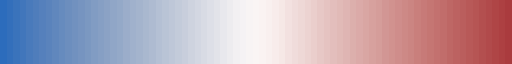

In [62]:
cmap_M_min = sns.color_palette("vlag", n_colors = len(bins))
palette_M_min = matplotlib.colors.ListedColormap(cmap_M_min)
palette_M_min

<>:59: SyntaxWarning: invalid escape sequence '\l'
<>:78: SyntaxWarning: invalid escape sequence '\D'
<>:59: SyntaxWarning: invalid escape sequence '\l'
<>:78: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_119335/1461605331.py:59: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
/tmp/ipykernel_119335/1461605331.py:78: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')


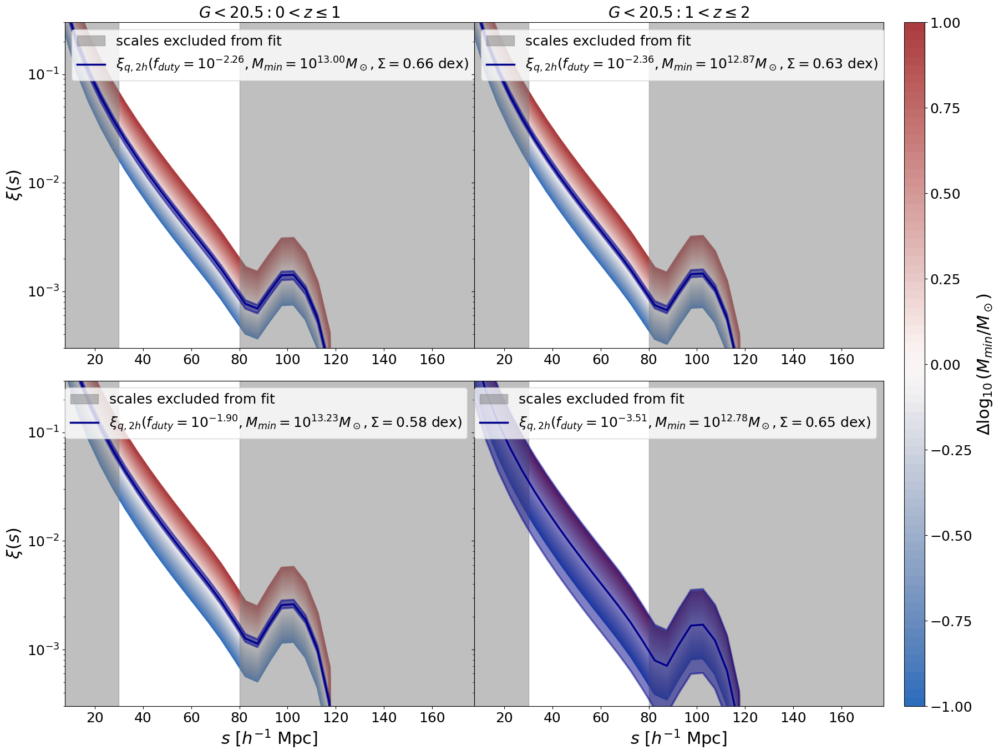

In [63]:
# remove bottom panel and just print bq somewhere
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 4, hspace = 0.1, wspace = 0, width_ratios = [1,1,0.05,0.05])

l = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j+l])
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], 
                                                                                                    N, cosmo)) # good
    
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                      alpha = 0.5, label = 'scales excluded from fit')
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                      alpha = 0.5)

    # plot new fit
    # bins_m = np.logspace(M_min[j],M_max,79)
    # bins_m = np.logspace(M_min[j]-3*sigma[j]/np.log(10),M_max,79)
    # n_m=HOD_scatter(10**f_duty[j], M_min[j], bins_m, sigma[j])
    # cf_2h_zbin, b_q = cf_2h(bins_m, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                         recenter = False)
    n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j])
    cf_2h_zbin, b_q = cf_2h(bins, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot, \Sigma={:.2f}$ dex)'.format(f_duty[j], M_min[j], 
                                                                                                                           sigma[j]), 
             color = 'darkblue')

    for k in range(len(bins)):
        M_min_k = M_min[j]-1+k/int(len(bins)/2)
        # bins_m = np.logspace(M_min_k, M_max, 79)
        # bins_m = np.logspace(M_min_k-3*sigma[j]/np.log(10), M_max, 79)
        # n_m=HOD_scatter(10**f_duty[j], M_min_k, bins_m, sigma[j])
        # cf_2h_sample, _ = cf_2h(bins_m, n_m, a_zbin[j], 
        #          cosmo_planck18, cf_matter_chi2[j], recenter = False)
        n_m=HOD_scatter(10**f_duty[j], M_min_k, bins, sigma[j])
        cf_2h_sample, _ = cf_2h(bins, n_m, a_zbin[j], 
                 cosmo_planck18, cf_matter_chi2[j], recenter = False)
        ax1.plot(quaia.recenter(rbins_chi2), cf_2h_sample, linewidth = 2.5, color = cmap_M_min[k], zorder = 0) # color = cmaps[i][j], alpha = (l+1)/len(bins))
        
    # cf_2h_samples=[]
    # for i in range(len(ind)):
    #     # bins_m = np.logspace(M_min_samples[j][i],M_max,79)
    #     bins_m = np.logspace(M_min_samples[j][i]-3*sigma_samples[j][i]/np.log(10),M_max,79)
    #     n_m=HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins_m, sigma_samples[j][i])
    #     cf_2h_sample, b_q_sample = cf_2h(bins_m, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                             recenter = False)
    #     cf_2h_samples.append(cf_2h_sample)
    cf_2h_samples = [cf_2h(bins, HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i]), a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)[0] for i in range(len(ind))]
    cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
    ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_16, cf_2h_84, linewidth = 2.5, alpha = 0.5,
             color = 'darkblue')   
    
    if j % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_ylim(3e-4, 3e-1)
    ax1.legend()
    
    if j % 2 == 0:
        ax1.set_ylabel(r'$\xi(s)$')

    else:
        ax1.set_yticklabels([])

    if j > 1:
        ax1.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j == 1:
        l+=2

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[:,-1]), 
                label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
plt.show()

In [64]:
sigma_k_array = np.linspace(0,1.4, 51) #-4

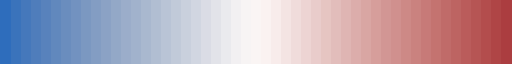

In [65]:
cmap_sigma = sns.color_palette("vlag", n_colors = len(sigma_k_array))
palette_sigma = matplotlib.colors.ListedColormap(cmap_sigma)
palette_sigma

<>:59: SyntaxWarning: invalid escape sequence '\l'
<>:78: SyntaxWarning: invalid escape sequence '\D'
<>:59: SyntaxWarning: invalid escape sequence '\l'
<>:78: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_119335/1271468749.py:59: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
/tmp/ipykernel_119335/1271468749.py:78: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \Sigma$ dex')


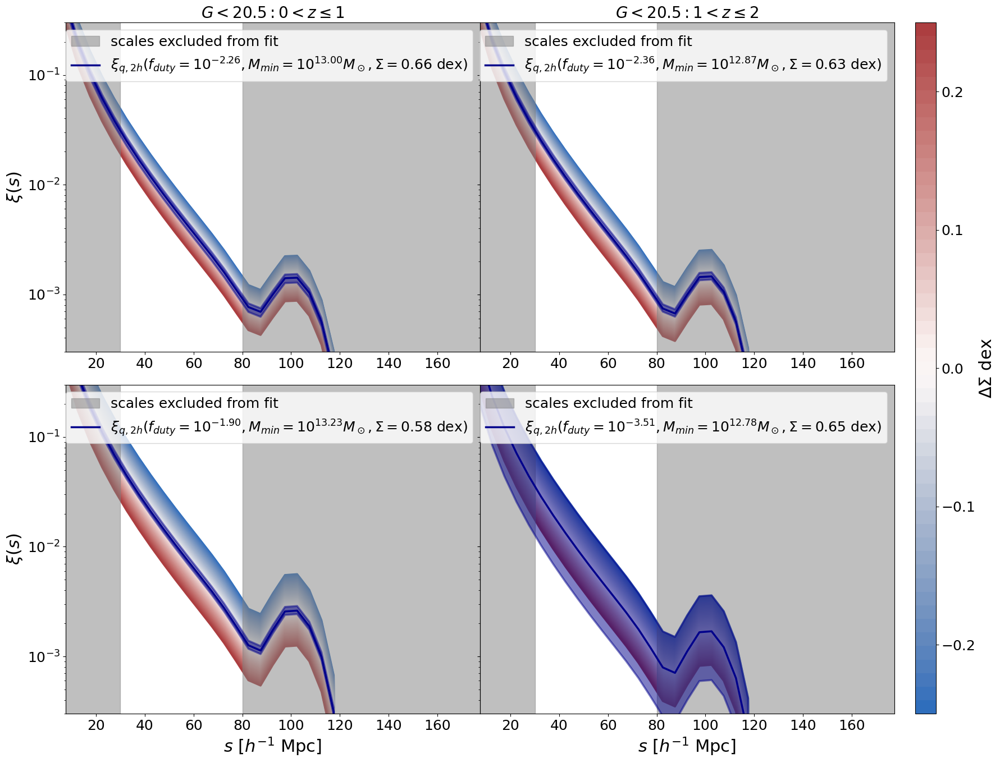

In [67]:
# remove bottom panel and just print bq somewhere
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 4, hspace = 0.1, wspace = 0, width_ratios = [1,1,0.05,0.05])

l = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j+l])
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], 
                                                                                                    N, cosmo)) # good
    
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                      alpha = 0.5, label = 'scales excluded from fit')
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                      alpha = 0.5)

    # plot new fit
    # bins_m = np.logspace(M_min[j],M_max,79)
    # bins_m = np.logspace(M_min[j]-3*sigma[j]/np.log(10),M_max,79)
    # n_m=HOD_scatter(10**f_duty[j], M_min[j], bins_m, sigma[j])
    # cf_2h_zbin, b_q = cf_2h(bins_m, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                         recenter = False)
    n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j])
    cf_2h_zbin, b_q = cf_2h(bins, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot, \Sigma={:.2f}$ dex)'.format(f_duty[j], M_min[j], 
                                                                                                                           sigma[j]), 
             color = 'darkblue')

    for k in range(len(sigma_k_array)):
        # k = 11
        # print(0.25*(-1+k/int(len(sigma_k_array)/2)))
        sigma_k = sigma[j]+0.25*(-1+k/int(len(sigma_k_array)/2))
        # print(0.25*(-1+k/int(len(sigma_k_array)/2)))
        # n_m=HOD_scatter(10**f_duty[j], M_min[j], bins_m, sigma_k)
        # cf_2h_sample, _ = cf_2h(bins_m, n_m, a_zbin[j], 
        #          cosmo_planck18, cf_matter_chi2[j], recenter = False)
        n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma_k)
        cf_2h_sample, _ = cf_2h(bins, n_m, a_zbin[j], 
                 cosmo_planck18, cf_matter_chi2[j], recenter = False)
        ax1.plot(quaia.recenter(rbins_chi2), cf_2h_sample, linewidth = 2.5, color = cmap_sigma[k], zorder = 0) # color = cmaps[i][j], alpha = (l+1)/len(bins))
        
    # cf_2h_samples=[]
    # for i in range(len(ind)):
    #     # bins_m = np.logspace(M_min_samples[j][i],M_max,79)
    #     n_m=HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins_m, sigma_samples[j][i])
    #     cf_2h_sample, b_q_sample = cf_2h(bins_m, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                             recenter = False)
    #     cf_2h_samples.append(cf_2h_sample)
    cf_2h_samples = [cf_2h(bins, HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i]), a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)[0] for i in range(len(ind))]
    cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
    ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_16, cf_2h_84, linewidth = 2.5, alpha = 0.5,
             color = 'darkblue')   
    
    if j % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_ylim(3e-4, 3e-1)
    ax1.legend()
    
    if j % 2 == 0:
        ax1.set_ylabel(r'$\xi(s)$')

    else:
        ax1.set_yticklabels([])

    if j > 1:
        ax1.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j == 1:
        l+=2

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_sigma, norm = matplotlib.colors.Normalize(vmin=-0.25, vmax = 0.25)), cax = fig.add_subplot(gs[:,-1]), 
                label = '$\Delta \Sigma$ dex')
plt.show()

In [68]:
b_q_percentile = []
for j in z_array:
    # b_q_samples=[]
    # for i in range(len(ind)):
    #     # bins_m = np.logspace(M_min_samples[j][i],M_max,79)
    #     bins_m = np.logspace(M_min_samples[j][i]-3*sigma_samples[j][i]/np.log(10),M_max,79)
    #     n_m=HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins_m, sigma_samples[j][i])
    #     b_q_samples.append(cf_2h(bins_m, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                             recenter = False)[1])
    b_q_samples=[cf_2h(bins, HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i]), a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)[1]for i in range(len(ind))]
    b_q_percentile.append(np.percentile(b_q_samples, [16, 84]))
b_q_lo, b_q_hi = np.array(b_q_percentile).T

In [69]:
# fig = plt.figure(figsize = (10, 8))
# labels_cf = ['qq', r'$\xi_{2h}$']
# gs = gridspec.GridSpec(1, 3, width_ratios = [1, 0.05, 0.05], wspace = 0)
# ax1 = fig.add_subplot(gs[0])
    
# b_q = [cf_2h(bins_M_min[j], n_m_array[j], a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
#              recenter = False)[1] for j in z_array]
# ax1.plot(z_eff, b_q, linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

# # b_q=[]
# # for j in z_array:
# #     # bins_m = np.logspace(M_min[j], M_max, 79)
# #     bins_m = np.logspace(M_min[j]-3*sigma[j]/np.log(10), M_max, 79)
# #     n_m=HOD_scatter(10**f_duty[j], M_min[j], bins_m, sigma[j])
# #     b_q.append(cf_2h(bins_m, n_m, a_zbin[j], cosmo_planck18, 
# #                  cf_matter_chi2[j], recenter = False)[1])
# b_q=[cf_2h(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a_zbin[j], cosmo_planck18, 
#                  cf_matter_chi2[j], recenter = False)[1] for j in z_array]
# ax1.plot(zbin, b_q, linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
# ax1.fill_between(zbin, b_q_lo, b_q_hi, alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

# for k in range(len(bins)):
    
#     # b_q=[]
#     # for j in z_array:
#     #     M_min_k = M_min[j]-1+k/int(len(bins)/2)
#     #     # bins_m = np.logspace(M_min_k, M_max, 79)
#     #     bins_m = np.logspace(M_min_k-3*sigma[j]/np.log(10), M_max, 79)
#     #     n_m=HOD_scatter(10**f_duty[j], M_min_k, bins_m, sigma[j])
#     #     b_q.append(cf_2h(bins_m, n_m, a_zbin[j], 
#     #                  cosmo_planck18, cf_matter_chi2[j], recenter = False)[1])
        
#     b_q=[cf_2h(bins, HOD_scatter(10**f_duty[j], M_min[j]-1+k/int(len(bins)/2), bins, sigma[j]), a_zbin[j], 
#                      cosmo_planck18, cf_matter_chi2[j], recenter = False)[1] for j in z_array]
#     ax1.plot(zbin, b_q, linewidth = 2.5, color = cmap_M_min[k], zorder = 0) # color = cmaps[i][j], alpha = (l+1)/len(bins))

# ax1.plot(zbin, b_quaia(1.26, a_zbin), linestyle = '-.', linewidth = 2.5, 
#          label = 'Piccirilli et al. 2024 (GMV)', color = 'green') # eq 3.6 in https://arxiv.org/abs/2402.05761
# ax1.plot(zbin, b_quaia(1.15, a_zbin), linestyle = '-.', linewidth = 2.5, 
#          label = 'Piccirilli et al. 2024 (No-TT)', color = 'purple') # eq 3.6 in https://arxiv.org/abs/2402.05761
# ax1.plot(zbin, b_eboss(zbin), linestyle = '--', linewidth = 2.5, label = 'Laurent et al. 2017', 
#          color = 'black') # eq 3.6 in https://arxiv.org/abs/2402.05761

# ax1.plot(zbin, b_cf20, linestyle = ':', linewidth = 2.5, label = r'$b_{\xi, 20}$', color = 'orange') 
# ax1.plot(zbin, b_wp20, linestyle = ':', linewidth = 2.5, label = '$b_{w_p, 20}$', color = 'red') 

# ax1.set_title('$G<{}$'.format(G_hi))

# ax1.set_xlabel('$z$')
# ax1.set_ylim(0, 10)
# ax1.set_xlim(zbin[0], zbin[-1])
# ax1.set_ylabel(r'$b_q$')

# custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5),
#                 Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5),
#                 Line2D([0], [0], color = 'green', linestyle = '-.', linewidth = 2.5), 
#                 Line2D([0], [0], color = 'purple', linestyle = '-.', linewidth = 2.5),
#                 Line2D([0], [0], color = 'black', linestyle = '--', linewidth = 2.5), 
#                 Line2D([0], [0], color = 'orange', linestyle = ':', linewidth = 2.5), 
#                 Line2D([0], [0], color = 'red', linestyle = ':', linewidth = 2.5)]
# second_legend = ax1.legend(custom_lines, [r'$\log_{{10}}(M_{{min}}/M_\odot)\approx{:.2f}$'.format(12.8), 
#                                           'dynesty', 'Piccirilli et al. 2024 (GMV)', 'Piccirilli et al. 2024 (No-TT)', 
#                                           'Laurent et al. 2017', r'$b_{\xi, 20}$', '$b_{w_p, 20}$'], ncol = 2, bbox_to_anchor = (0.5, -0.1), 
#                            loc='upper center')
# fig.add_artist(second_legend)

# cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[:,-1]), 
#                     label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
# plt.show()

<>:51: SyntaxWarning: invalid escape sequence '\D'
<>:100: SyntaxWarning: invalid escape sequence '\D'
<>:51: SyntaxWarning: invalid escape sequence '\D'
<>:100: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_119335/2361392120.py:51: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
/tmp/ipykernel_119335/2361392120.py:100: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \Sigma$ dex')


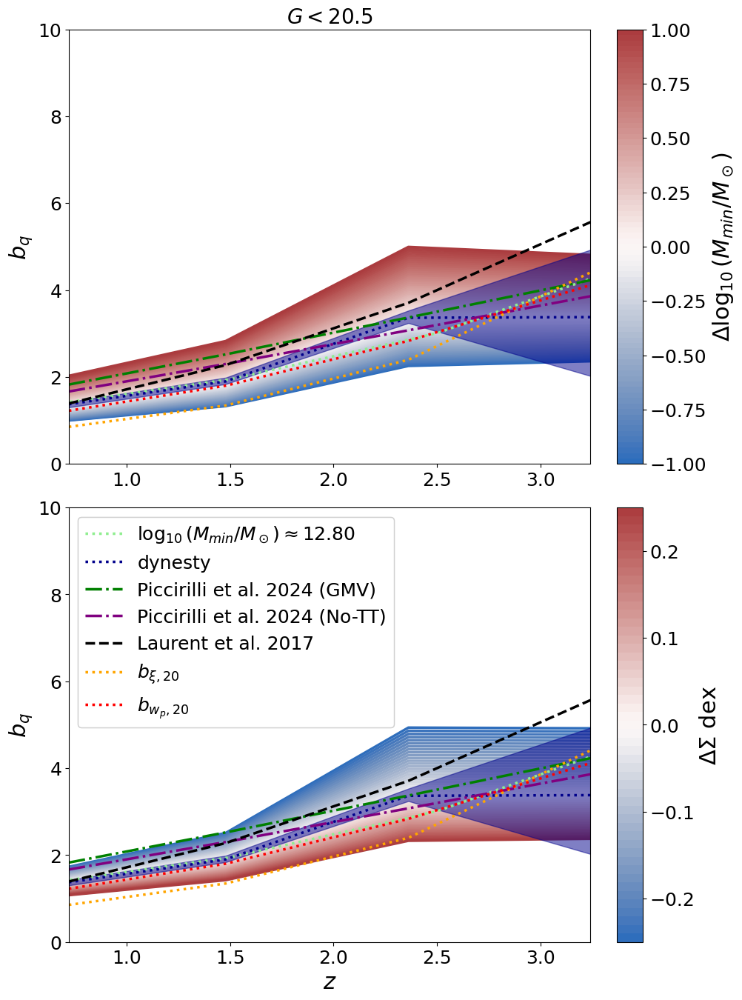

In [70]:
fig = plt.figure(figsize = (10, 16))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(2, 3, width_ratios = [1, 0.05, 0.05], wspace = 0, hspace = 0.1)
ax1 = fig.add_subplot(gs[0])
    
b_q = [cf_2h(bins_M_min[j], n_m_array[j], a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
             recenter = False)[1] for j in z_array]
ax1.plot(z_eff, b_q, linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

b_q=[cf_2h(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a_zbin[j], cosmo_planck18, 
                 cf_matter_chi2[j], recenter = False)[1] for j in z_array]
ax1.plot(zbin, b_q, linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, b_q_lo, b_q_hi, alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

for k in range(len(bins)):
        
    b_q=[cf_2h(bins, HOD_scatter(10**f_duty[j], M_min[j]-1+k/int(len(bins)/2), bins, sigma[j]), a_zbin[j], 
                     cosmo_planck18, cf_matter_chi2[j], recenter = False)[1] for j in z_array]
    ax1.plot(zbin, b_q, linewidth = 2.5, color = cmap_M_min[k], zorder = 0) # color = cmaps[i][j], alpha = (l+1)/len(bins))

ax1.plot(zbin, b_quaia(1.26, a_zbin), linestyle = '-.', linewidth = 2.5, 
         label = 'Piccirilli et al. 2024 (GMV)', color = 'green') # eq 3.6 in https://arxiv.org/abs/2402.05761
ax1.plot(zbin, b_quaia(1.15, a_zbin), linestyle = '-.', linewidth = 2.5, 
         label = 'Piccirilli et al. 2024 (No-TT)', color = 'purple') # eq 3.6 in https://arxiv.org/abs/2402.05761
ax1.plot(zbin, b_eboss(zbin), linestyle = '--', linewidth = 2.5, label = 'Laurent et al. 2017', 
         color = 'black') # eq 3.6 in https://arxiv.org/abs/2402.05761

ax1.plot(zbin, b_cf20, linestyle = ':', linewidth = 2.5, label = r'$b_{\xi, 20}$', color = 'orange') 
ax1.plot(zbin, b_wp20, linestyle = ':', linewidth = 2.5, label = '$b_{w_p, 20}$', color = 'red') 

ax1.set_title('$G<{}$'.format(G_hi))

# ax1.set_xlabel('$z$')
ax1.set_ylim(0, 10)
ax1.set_xlim(zbin[0], zbin[-1])
ax1.set_ylabel(r'$b_q$')

# custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5),
#                 Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5),
#                 Line2D([0], [0], color = 'green', linestyle = '-.', linewidth = 2.5), 
#                 Line2D([0], [0], color = 'purple', linestyle = '-.', linewidth = 2.5),
#                 Line2D([0], [0], color = 'black', linestyle = '--', linewidth = 2.5), 
#                 Line2D([0], [0], color = 'orange', linestyle = ':', linewidth = 2.5), 
#                 Line2D([0], [0], color = 'red', linestyle = ':', linewidth = 2.5)]
# second_legend = ax1.legend(custom_lines, [r'$\log_{{10}}(M_{{min}}/M_\odot)\approx{:.2f}$'.format(12.8), 
#                                           'dynesty', 'Piccirilli et al. 2024 (GMV)', 'Piccirilli et al. 2024 (No-TT)', 
#                                           'Laurent et al. 2017', r'$b_{\xi, 20}$', '$b_{w_p, 20}$'])
# fig.add_artist(second_legend)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[0,-1]), 
                    label = '$\Delta \log_{10}(M_{min}/M_\odot)$')

ax1 = fig.add_subplot(gs[3])
    
b_q = [cf_2h(bins_M_min[j], n_m_array[j], a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
             recenter = False)[1] for j in z_array]
ax1.plot(z_eff, b_q, linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

b_q=[cf_2h(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a_zbin[j], cosmo_planck18, 
                 cf_matter_chi2[j], recenter = False)[1] for j in z_array]
ax1.plot(zbin, b_q, linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, b_q_lo, b_q_hi, alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

for k in range(len(sigma_k_array)):
        
    b_q=[cf_2h(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]+0.25*(-1+k/int(len(sigma_k_array)/2))), a_zbin[j], 
                     cosmo_planck18, cf_matter_chi2[j], recenter = False)[1] for j in z_array]
    ax1.plot(zbin, b_q, linewidth = 2.5, color = cmap_sigma[k], zorder = 0) # color = cmaps[i][j], alpha = (l+1)/len(bins))

ax1.plot(zbin, b_quaia(1.26, a_zbin), linestyle = '-.', linewidth = 2.5, 
         label = 'Piccirilli et al. 2024 (GMV)', color = 'green') # eq 3.6 in https://arxiv.org/abs/2402.05761
ax1.plot(zbin, b_quaia(1.15, a_zbin), linestyle = '-.', linewidth = 2.5, 
         label = 'Piccirilli et al. 2024 (No-TT)', color = 'purple') # eq 3.6 in https://arxiv.org/abs/2402.05761
ax1.plot(zbin, b_eboss(zbin), linestyle = '--', linewidth = 2.5, label = 'Laurent et al. 2017', 
         color = 'black') # eq 3.6 in https://arxiv.org/abs/2402.05761

ax1.plot(zbin, b_cf20, linestyle = ':', linewidth = 2.5, label = r'$b_{\xi, 20}$', color = 'orange') 
ax1.plot(zbin, b_wp20, linestyle = ':', linewidth = 2.5, label = '$b_{w_p, 20}$', color = 'red') 

# ax1.set_title('$G<{}$'.format(G_hi))

ax1.set_xlabel('$z$')
ax1.set_ylim(0, 10)
ax1.set_xlim(zbin[0], zbin[-1])
ax1.set_ylabel(r'$b_q$')

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5),
                Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5),
                Line2D([0], [0], color = 'green', linestyle = '-.', linewidth = 2.5), 
                Line2D([0], [0], color = 'purple', linestyle = '-.', linewidth = 2.5),
                Line2D([0], [0], color = 'black', linestyle = '--', linewidth = 2.5), 
                Line2D([0], [0], color = 'orange', linestyle = ':', linewidth = 2.5), 
                Line2D([0], [0], color = 'red', linestyle = ':', linewidth = 2.5)]
second_legend = ax1.legend(custom_lines, [r'$\log_{{10}}(M_{{min}}/M_\odot)\approx{:.2f}$'.format(12.8), 
                                          'dynesty', 'Piccirilli et al. 2024 (GMV)', 'Piccirilli et al. 2024 (No-TT)', 
                                          'Laurent et al. 2017', r'$b_{\xi, 20}$', '$b_{w_p, 20}$'])
fig.add_artist(second_legend)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_sigma, norm = matplotlib.colors.Normalize(vmin=-0.25, vmax = 0.25)), cax = fig.add_subplot(gs[1,-1]), 
                    label = '$\Delta \Sigma$ dex')
plt.show()

In [71]:
M_h_percentile = []
for j in z_array:
    M_h_samples=[]
    for i in range(len(ind)):
        # bins_m = np.logspace(M_min_samples[j][i],M_max,79)
        # bins_m = np.logspace(M_min_samples[j][i]-3*sigma_samples[j][i]/np.log(10),M_max,79)
        # n_m=HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins_m, sigma_samples[j][i])
        # M_h_samples.append(M(bins_m, n_m, a = a_zbin[j], cosmo = cosmo_planck18, 
        #  recenter = False)[0])
        n_m=HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i])
        M_h_samples.append(M(bins, n_m, a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[0])
    M_h_percentile.append(np.percentile(M_h_samples, [16, 84]))
M_h_lo, M_h_hi = np.array(M_h_percentile).T

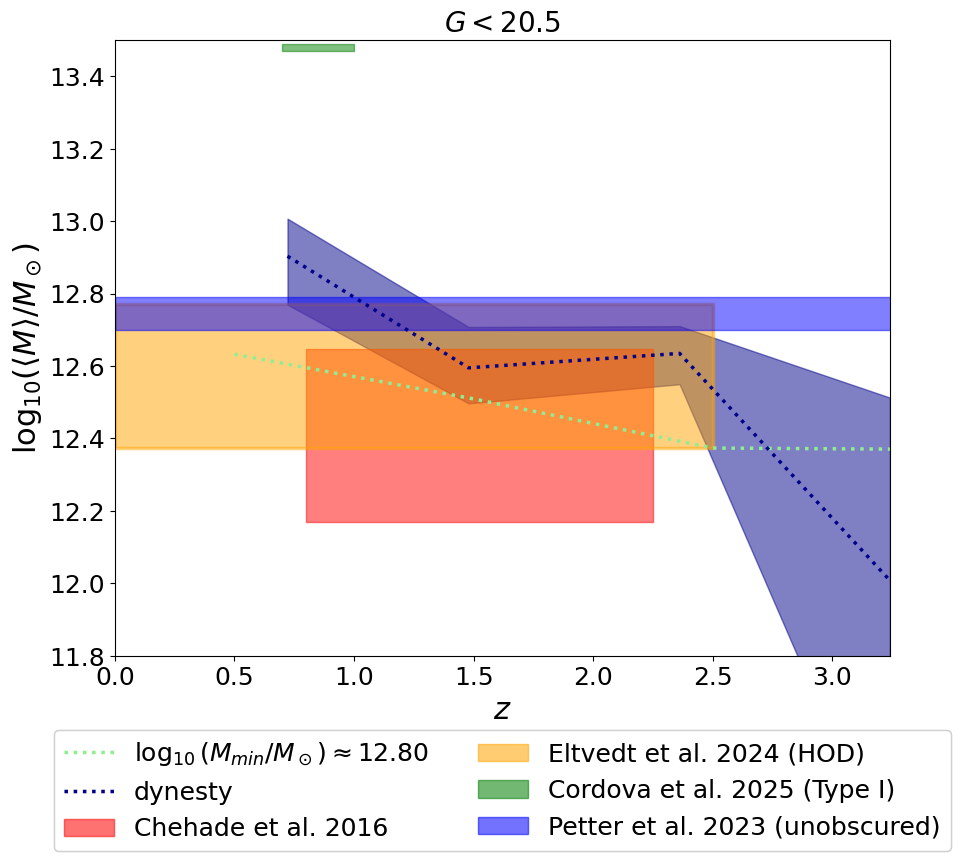

In [72]:
fig = plt.figure(figsize = (10, 8))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(1, 1, wspace = 0)
ax1 = fig.add_subplot(gs[0])
    
M_h = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
ax1.plot(z_eff, np.log10(M_h), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

# M_h=[]
# for j in z_array:
#     # bins_m = np.logspace(M_min[j], M_max, 79)
#     bins_m = np.logspace(M_min[j]-3*sigma[j]/np.log(10), M_max, 79)
#     n_m=HOD_scatter(10**f_duty[j], M_min[j], bins_m, sigma[j])
#     M_h.append(M(bins_m, n_m, a = a_zbin[j], cosmo = cosmo_planck18, 
#          recenter = False)[0])
M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[0] for j in z_array]
ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(M_h_lo), np.log10(M_h_hi), alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

z = np.linspace(0.8, 2.25)
ax1.fill_between(z, [np.log10(1e12/Planck18.h)]*len(z), [np.log10(3e12/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Chehade et al. 2016', color = 'red')
ax1.set_title('$G<{}$'.format(G_hi))
ax1.fill_between(np.linspace(0, 2.5), [np.log10(1.6e12/Planck18.h)]*len(z), [np.log10(4e12/Planck18.h)]*len(z), linewidth = 2.5, 
                 label = 'Eltvedt et al. 2024 (HOD)', alpha = 0.5, color = 'orange')
ax1.fill_between(np.linspace(0.7, 1), [13.47]*len(z), [13.49]*len(z), alpha = 0.5, label = 'Cordova et al. 2025 (Type I)', color = 'green')

# check redshift range and check cordova type i was right to include because conflicts with this
ax1.fill_between(np.linspace(0, 3.5), [np.log10(10**12.53/Planck18.h)]*len(z), [np.log10(10**12.62/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Petter et al. 2023 (unobscured)', color = 'blue')

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5), 
                # mpatches.Patch(color='lightgreen', alpha = 0.5), 
                Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5), mpatches.Patch(color='red', alpha = 0.5), 
                mpatches.Patch(color='orange', alpha = 0.5), mpatches.Patch(color='green', alpha = 0.5), mpatches.Patch(color='blue', alpha = 0.5)]
second_legend = ax1.legend(custom_lines, [#'Giner Mascarell et al. 2025', 
                                          r'$\log_{{10}}(M_{{min}}/M_\odot)\approx{:.2f}$'.format(12.8), 
                                          'dynesty', 'Chehade et al. 2016', 'Eltvedt et al. 2024 (HOD)', 'Cordova et al. 2025 (Type I)', 'Petter et al. 2023 (unobscured)'], 
                           ncol = 2, bbox_to_anchor = (0.5, -0.1), loc='upper center')
fig.add_artist(second_legend)

ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(\langle M \rangle/M_\odot)$')
ax1.set_xlim(0, zbin[-1])
ax1.set_ylim(11.8, 13.5)

plt.show()

In [73]:
# fig = plt.figure(figsize = (10, 8))
# labels_cf = ['qq', r'$\xi_{2h}$']
# gs = gridspec.GridSpec(1, 3, width_ratios = [1, 0.05, 0.05], wspace = 0)
# ax1 = fig.add_subplot(gs[0])

# for k in range(len(bins)):
    
#     # M_h=[]
#     # for j in z_array:
#     #     M_min_k = M_min[j]-1+k/int(len(bins)/2)
#     #     # bins_m = np.logspace(M_min_k, M_max, 79)
#     #     bins_m = np.logspace(M_min_k-3*sigma[j]/np.log(10), M_max, 79)
#     #     n_m=HOD_scatter(10**f_duty[j], M_min_k, bins_m, sigma[j])
#     #     M_h.append(M(bins_m, n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0])
#     M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j]-1+k/int(len(bins)/2), bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
#     ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, 
#              label = r'$f_{{duty}}: {:.2f}\%-{:.2f}\%, M_{{min}}:{:.2f} M_\odot$'.format(fduty[0]*100, fduty[-1]*100, np.log10(bins[k])),
#              color = cmap_M_min[k], zorder = 0) #, alpha = (1+k)/len(bins))
    
# M_h = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
# ax1.plot(z_eff, np.log10(M_h), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

# # M_h=[]
# # for j in z_array:
# #     # bins_m = np.logspace(M_min[j], M_max, 79)
# #     bins_m = np.logspace(M_min[j]-3*sigma[j]/np.log(10), M_max, 79)
# #     n_m=HOD_scatter(10**f_duty[j], M_min[j], bins_m, sigma[j])
# #     M_h.append(M(bins_m, n_m, a = a_zbin[j], cosmo = cosmo_planck18, 
# #          recenter = False)[0])
# M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, 
#          recenter = False)[0] for j in z_array]
# ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
# ax1.fill_between(zbin, np.log10(M_h_lo), np.log10(M_h_hi), alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

# z = np.linspace(0.8, 2.25)
# ax1.fill_between(z, [np.log10(1e12/Planck18.h)]*len(z), [np.log10(3e12/Planck18.h)]*len(z), alpha = 0.5, 
#                  label = 'Chehade et al. 2016', color = 'red')
# ax1.set_title('$G<{}$'.format(G_hi))
# ax1.fill_between(np.linspace(0, 2.5), [np.log10(1.6e12/Planck18.h)]*len(z), [np.log10(4e12/Planck18.h)]*len(z), linewidth = 2.5, 
#                  label = 'Eltvedt et al. 2024 (HOD)', alpha = 0.5, color = 'orange')
# ax1.fill_between(np.linspace(0.7, 1), [13.47]*len(z), [13.49]*len(z), alpha = 0.5, label = 'Cordova et al. 2025 (Type I)', color = 'green')

# # check redshift range and check cordova type i was right to include because conflicts with this
# ax1.fill_between(np.linspace(0, 3.5), [np.log10(10**12.53/Planck18.h)]*len(z), [np.log10(10**12.62/Planck18.h)]*len(z), alpha = 0.5, 
#                  label = 'Petter et al. 2023 (unobscured)', color = 'blue')

# custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5), Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5), mpatches.Patch(color='red', alpha = 0.5), 
#                 mpatches.Patch(color='orange', alpha = 0.5), mpatches.Patch(color='green', alpha = 0.5), mpatches.Patch(color='blue', alpha = 0.5)]
# second_legend = ax1.legend(custom_lines, [r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0]), 'dynesty',
#                             'Chehade et al. 2016', 'Eltvedt et al. 2024 (HOD)', 'Cordova et al. 2025 (Type I)', 'Petter et al. 2023 (unobscured)'], 
#                            ncol = 2, bbox_to_anchor = (0.5, -0.15), loc='upper center')
# fig.add_artist(second_legend)

# ax1.set_xlabel('$z$')
# ax1.set_ylabel(r'log$_{10}(\langle M \rangle/M_\odot)$')
# ax1.set_xlim(0, zbin[-1])
# ax1.set_ylim(11.8, 13.5)

# cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[:,-1]), 
#                     label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
# plt.show()

<>:46: SyntaxWarning: invalid escape sequence '\D'
<>:94: SyntaxWarning: invalid escape sequence '\D'
<>:46: SyntaxWarning: invalid escape sequence '\D'
<>:94: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_119335/3302136625.py:46: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
/tmp/ipykernel_119335/3302136625.py:94: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \Sigma$ dex')


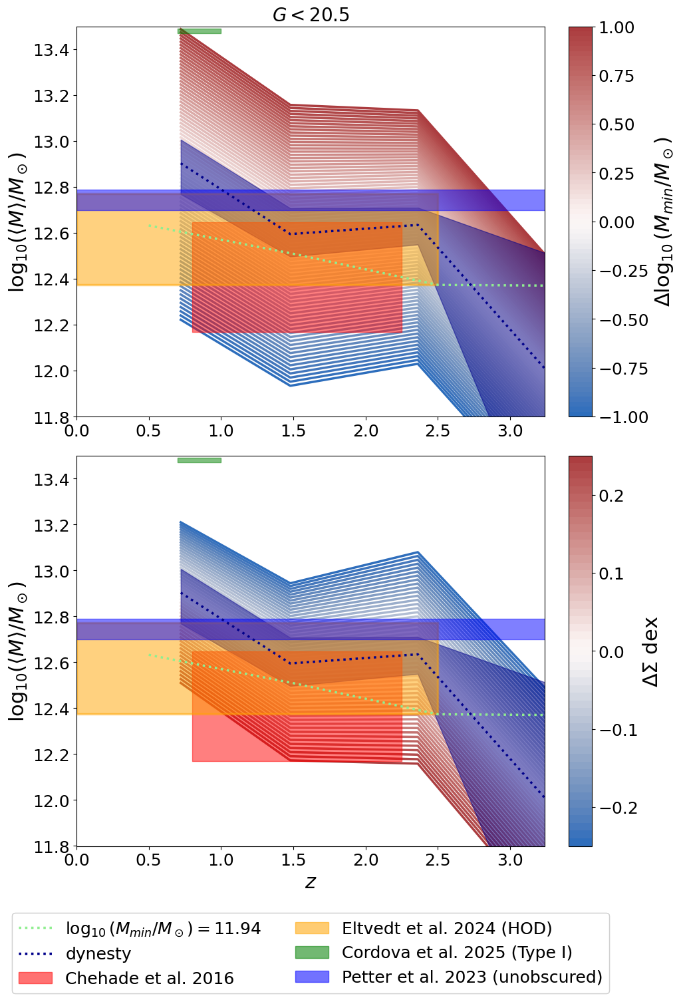

In [74]:
fig = plt.figure(figsize = (10, 16))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(2, 3, width_ratios = [1, 0.05, 0.05], wspace = 0, hspace = 0.1)
ax1 = fig.add_subplot(gs[0])

for k in range(len(bins)):
    
    M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j]-1+k/int(len(bins)/2), bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
    ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, 
             label = r'$f_{{duty}}: {:.2f}\%-{:.2f}\%, M_{{min}}:{:.2f} M_\odot$'.format(fduty[0]*100, fduty[-1]*100, np.log10(bins[k])),
             color = cmap_M_min[k], zorder = 0) #, alpha = (1+k)/len(bins))
    
M_h = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
ax1.plot(z_eff, np.log10(M_h), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[0] for j in z_array]
ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(M_h_lo), np.log10(M_h_hi), alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

z = np.linspace(0.8, 2.25)
ax1.fill_between(z, [np.log10(1e12/Planck18.h)]*len(z), [np.log10(3e12/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Chehade et al. 2016', color = 'red')
ax1.set_title('$G<{}$'.format(G_hi))
ax1.fill_between(np.linspace(0, 2.5), [np.log10(1.6e12/Planck18.h)]*len(z), [np.log10(4e12/Planck18.h)]*len(z), linewidth = 2.5, 
                 label = 'Eltvedt et al. 2024 (HOD)', alpha = 0.5, color = 'orange')
ax1.fill_between(np.linspace(0.7, 1), [13.47]*len(z), [13.49]*len(z), alpha = 0.5, label = 'Cordova et al. 2025 (Type I)', color = 'green')

# check redshift range and check cordova type i was right to include because conflicts with this
ax1.fill_between(np.linspace(0, 3.5), [np.log10(10**12.53/Planck18.h)]*len(z), [np.log10(10**12.62/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Petter et al. 2023 (unobscured)', color = 'blue')

# custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5), Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5), mpatches.Patch(color='red', alpha = 0.5), 
#                 mpatches.Patch(color='orange', alpha = 0.5), mpatches.Patch(color='green', alpha = 0.5), mpatches.Patch(color='blue', alpha = 0.5)]
# second_legend = ax1.legend(custom_lines, [r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0]), 'dynesty',
#                             'Chehade et al. 2016', 'Eltvedt et al. 2024 (HOD)', 'Cordova et al. 2025 (Type I)', 'Petter et al. 2023 (unobscured)'], 
#                            bbox_to_anchor = (1.6, 0), loc='upper center')
# fig.add_artist(second_legend)

# ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(\langle M \rangle/M_\odot)$')
ax1.set_xlim(0, zbin[-1])
ax1.set_ylim(11.8, 13.5)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[0,-1]), 
                    label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
# plt.show()

# fig = plt.figure(figsize = (10, 8))
# labels_cf = ['qq', r'$\xi_{2h}$']
# gs = gridspec.GridSpec(1, 3, width_ratios = [1, 0.05, 0.05], wspace = 0)
ax1 = fig.add_subplot(gs[3])

for k in range(len(sigma_k_array)):
    
    M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]+0.25*(-1+k/int(len(sigma_k_array)/2))), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
    ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, 
             label = r'$f_{{duty}}: {:.2f}\%-{:.2f}\%, M_{{min}}:{:.2f} M_\odot$'.format(fduty[0]*100, fduty[-1]*100, np.log10(bins[k])),
             color = cmap_sigma[k], zorder = 0) #, alpha = (1+k)/len(bins))
    
M_h = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
ax1.plot(z_eff, np.log10(M_h), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[0] for j in z_array]
ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(M_h_lo), np.log10(M_h_hi), alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

z = np.linspace(0.8, 2.25)
ax1.fill_between(z, [np.log10(1e12/Planck18.h)]*len(z), [np.log10(3e12/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Chehade et al. 2016', color = 'red')
# ax1.set_title('$G<{}$'.format(G_hi))
ax1.fill_between(np.linspace(0, 2.5), [np.log10(1.6e12/Planck18.h)]*len(z), [np.log10(4e12/Planck18.h)]*len(z), linewidth = 2.5, 
                 label = 'Eltvedt et al. 2024 (HOD)', alpha = 0.5, color = 'orange')
ax1.fill_between(np.linspace(0.7, 1), [13.47]*len(z), [13.49]*len(z), alpha = 0.5, label = 'Cordova et al. 2025 (Type I)', color = 'green')

# check redshift range and check cordova type i was right to include because conflicts with this
ax1.fill_between(np.linspace(0, 3.5), [np.log10(10**12.53/Planck18.h)]*len(z), [np.log10(10**12.62/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Petter et al. 2023 (unobscured)', color = 'blue')

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5), Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5), mpatches.Patch(color='red', alpha = 0.5), 
                mpatches.Patch(color='orange', alpha = 0.5), mpatches.Patch(color='green', alpha = 0.5), mpatches.Patch(color='blue', alpha = 0.5)]
second_legend = ax1.legend(custom_lines, [r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0]), 'dynesty',
                            'Chehade et al. 2016', 'Eltvedt et al. 2024 (HOD)', 'Cordova et al. 2025 (Type I)', 'Petter et al. 2023 (unobscured)'], 
                           ncol = 2, bbox_to_anchor = (0.5, -0.15), loc='upper center')
fig.add_artist(second_legend)

ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(\langle M \rangle/M_\odot)$')
ax1.set_xlim(0, zbin[-1])
ax1.set_ylim(11.8, 13.5)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_sigma, norm = matplotlib.colors.Normalize(vmin=-0.25, vmax = 0.25)), cax = fig.add_subplot(gs[1,-1]), 
                    label = '$\Delta \Sigma$ dex')
plt.show()

In [75]:
fduty_array = np.logspace(-5,0, 51) #-4

In [76]:
cmap_fduty_k = sns.color_palette("vlag", n_colors = len(fduty_array))

In [77]:
n_q_percentile = []
for j in z_array:
    # n_q_samples=[]
    # for i in range(len(ind)):
    #     # bins_m = np.logspace(M_min_samples[j][i],M_max,79)
    #     bins_m = np.logspace(M_min_samples[j][i]-3*sigma_samples[j][i]/np.log(10),M_max,79)
    #     n_m=HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins_m, sigma_samples[j][i])
    #     n_q_samples.append(M(bins_m, n_m, a = a_zbin[j], cosmo = cosmo_planck18, 
    #      recenter = False)[1])
    n_q_samples=[M(bins, HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i]), a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[1] for i in range(len(ind))]
    n_q_percentile.append(np.percentile(n_q_samples, [16, 50, 84]))
n_q_theory_fit_lo, n_q_theory_fit_mid, n_q_theory_fit_hi = np.array(n_q_percentile).T

<>:60: SyntaxWarning: invalid escape sequence '\D'
<>:98: SyntaxWarning: invalid escape sequence '\D'
<>:132: SyntaxWarning: invalid escape sequence '\D'
<>:60: SyntaxWarning: invalid escape sequence '\D'
<>:98: SyntaxWarning: invalid escape sequence '\D'
<>:132: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_119335/3389059879.py:60: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
/tmp/ipykernel_119335/3389059879.py:98: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(f_{duty})$')
/tmp/ipykernel_119335/3389059879.py:132: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \Sigma$ dex')


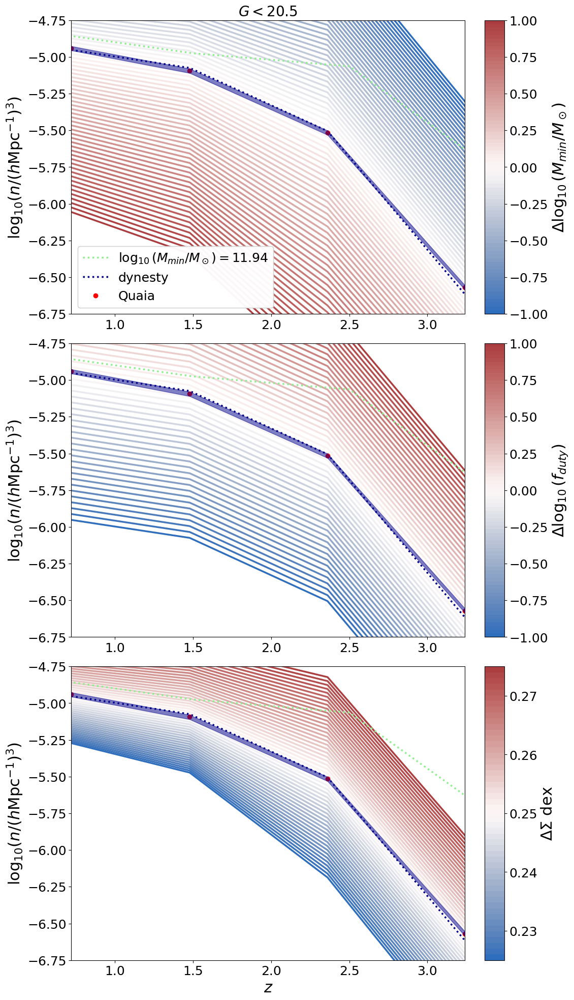

In [78]:
fig = plt.figure(figsize = (11, 24))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(3, 3, width_ratios = [1, 0.05, 0.05], wspace = 0, hspace = 0.1)
ax1 = fig.add_subplot(gs[0])
ylim = -6.75, -4.75

for k in range(len(bins)):
    
#     n_q_theory = []
#     for j in z_array:
#         M_min_k = M_min[j]-1+k/int(len(bins)/2)
#         # bins_m = np.logspace(M_min_k, M_max, 79)
# #         n_m=HOD_scatter(10**f_duty[j], M_min_k, bins_m, sigma[j])

# #         n_q_theory.append(M(bins_m, n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
#         n_m=HOD_scatter(10**f_duty[j], M_min_k, bins, sigma[j])

#         n_q_theory.append(M(bins, n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
        
    n_q_theory=[M(bins, HOD_scatter(10**f_duty[j], M_min[j]-1+k/int(len(bins)/2), bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
    ax1.plot(zbin, np.log10(n_q_theory), linewidth = 2.5, #alpha = (1+k)/len(bins),
             label = r'$f_{{duty}}: {:.2f}\%-{:.2f}\%, M_{{min}}:[{:.2f}-{:.2f}] M_\odot$'.format(f_duty[0]*100, f_duty[-1]*100, np.log10(bins[0]), 
                                                                                                  np.log10(bins[-1])), color = cmap_M_min[k])
    
# n_q_theory, n_q_theory_fit = [], [] #, n_q_theory_fit_lo, n_q_theory_fit_hi = [], [], [], []
# for j in z_array:
    
#     n_q_theory.append(M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
    
#     # bins_m = np.logspace(M_min[j], M_max, 79)
#     # n_m=HOD_scatter(10**f_duty[j], M_min[j], bins_m, sigma[j])
#     # n_q_theory_fit.append(M(bins_m, n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
#     n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j])
#     n_q_theory_fit.append(M(bins, n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])

n_q_theory=[M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
n_q_theory_fit=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]

ax1.plot(z_eff, np.log10(n_q_theory), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.plot(zbin, np.log10(n_q_theory_fit), linewidth = 2.5, color = 'darkblue', linestyle = ':', label = r'$\chi^2$ minimization') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(n_q_theory_fit_lo), np.log10(n_q_theory_fit_hi), color = 'darkblue', alpha = 0.5, label = r'$\chi^2$ minimization', zorder = 3) # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.errorbar(zbin, np.log10(n_q), linewidth = 2.5, marker = 'o', label = 'Quaia', color = 'red',
             yerr = [np.log10(n_q)-np.log10(np.subtract(n_q, n_q_err)), np.log10(np.add(n_q, n_q_err))-np.log10(n_q)], linestyle = 'None')

ax1.set_title('$G<{}$'.format(G_hi))
ax1.set_xlim(zbin[0], zbin[-1])

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5, 
                       label = r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0])),
                Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5, 
                       label = 'dynesty'), 
                Line2D([0], [0], color = 'red', marker = 'o', linestyle = 'None', linewidth = 2.5, label = 'Quaia')]
second_legend = ax1.legend(handles = custom_lines)
fig.add_artist(second_legend)

ax1.set_ylabel(r'log$_{10}(n/(h\mathrm{Mpc}^{-1})^3)$')
ax1.set_ylim(ylim)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[0,-1]), 
                    label = '$\Delta \log_{10}(M_{min}/M_\odot)$')

ax1 = fig.add_subplot(gs[3])
i = 1
l = 38

for k in range(len(fduty_array)):

#     n_q_theory=[]
#     for j in z_array:
        
#         # bins_m = np.logspace(M_min[j], M_max, 79)
#         # n_m=HOD_scatter(10**(f_duty[j]-1+k/int(len(fduty_array)/2)), M_min[j], bins_m, sigma[j])
#         # n_q_theory.append(M(np.logspace(M_min[j], M_max, 79), n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
#         n_m=HOD_scatter(10**(f_duty[j]-1+k/int(len(fduty_array)/2)), M_min[j], bins, sigma[j])
#         n_q_theory.append(M(bins, n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
        
    n_q_theory=[M(bins, HOD_scatter(10**(f_duty[j]-1+k/int(len(fduty_array)/2)), M_min[j], bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]

    ax1.plot(zbin, np.log10(n_q_theory), linewidth = 2.5, #alpha = (1+k)/len(bins),
             color = cmap_fduty_k[k])
    
n_q_theory = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
ax1.plot(z_eff, np.log10(n_q_theory), linewidth = 2.5, color = 'lightgreen', linestyle = ':', 
         label = r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0])) # color = cmaps[i][j], alpha = (l+1)/len(bins)) np.log10(bins[l])

ax1.plot(zbin, np.log10(n_q_theory_fit), linewidth = 2.5, color = 'darkblue', linestyle = ':', label = r'dynesty') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(n_q_theory_fit_lo), np.log10(n_q_theory_fit_hi), color = 'darkblue', alpha = 0.5, zorder = 3) # color = cmaps[i][j], alpha = (l+1)/len(bins))

ax1.errorbar(zbin, np.log10(n_q), linewidth = 2.5, marker = 'o', label = 'Quaia', color = 'red',
             yerr = [np.log10(n_q)-np.log10(np.subtract(n_q, n_q_err)), np.log10(np.add(n_q, n_q_err))-np.log10(n_q)], linestyle = 'None')

# ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(n/(h\mathrm{Mpc}^{-1})^3)$')
ax1.set_ylim(ylim)
ax1.set_xlim(zbin[0], zbin[-1])

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[1,-1]), 
                    label = '$\Delta \log_{10}(f_{duty})$')

ax1 = fig.add_subplot(gs[6])
for k in range(len(sigma_k_array)):

#     n_q_theory=[]
#     for j in z_array:
        
#         # bins_m = np.logspace(M_min[j], M_max, 79)
#         # n_m=HOD_scatter(10**f_duty[j], M_min[j], bins_m, sigma[j]-1+k/int(len(sigma_array)/2))
#         # n_q_theory.append(M(np.logspace(M_min[j], M_max, 79), n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
#         n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]-1+k/int(len(sigma_array)/2))
#         n_q_theory.append(M(bins, n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
        
    n_q_theory=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]+0.25*(-1+k/int(len(sigma_k_array)/2))), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
    ax1.plot(zbin, np.log10(n_q_theory), linewidth = 2.5, #alpha = (1+k)/len(bins),
             color = cmap_sigma[k])
    
n_q_theory = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
ax1.plot(z_eff, np.log10(n_q_theory), linewidth = 2.5, color = 'lightgreen', linestyle = ':', 
         label = r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0])) # color = cmaps[i][j], alpha = (l+1)/len(bins)) np.log10(bins[l])

ax1.plot(zbin, np.log10(n_q_theory_fit), linewidth = 2.5, color = 'darkblue', linestyle = ':', label = r'dynesty') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(n_q_theory_fit_lo), np.log10(n_q_theory_fit_hi), color = 'darkblue', alpha = 0.5, zorder = 3) # color = cmaps[i][j], alpha = (l+1)/len(bins))

ax1.errorbar(zbin, np.log10(n_q), linewidth = 2.5, marker = 'o', label = 'Quaia', color = 'red',
             yerr = [np.log10(n_q)-np.log10(np.subtract(n_q, n_q_err)), np.log10(np.add(n_q, n_q_err))-np.log10(n_q)], linestyle = 'None')

ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(n/(h\mathrm{Mpc}^{-1})^3)$')
ax1.set_ylim(ylim)
ax1.set_xlim(zbin[0], zbin[-1])

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_sigma, norm = matplotlib.colors.Normalize(vmin=0.25, vmax = 0.25)), cax = fig.add_subplot(gs[2,-1]), 
                    label = '$\Delta \Sigma$ dex')
plt.show()